# Data Analysis of Bank Marketing Campaign 
#### done by : Myriam El Amri , Rahma Kharrat and Chawki Hjaiji  
#### supervised by : Mr. Amor Messaoud


In [1]:
#imports
import pandas as pd
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
!pip install plotly


In [3]:

file_path = 'bank-additional-full.csv'
df = pd.read_csv(file_path, sep=';') 
df.head()


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


# Data Visualisation and Cleaning

In [4]:
 df_clean= df.copy()
df_clean.drop_duplicates(subset=None, keep='first', inplace=True)
df_clean.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [5]:
features = df_clean.columns
print(features)

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')


We have 'Unknown', 'nonexistent', and '999': These are missing values. Missing values can lead to biased or inaccurate results in data analysis. They can skew statistical measures like means, medians, and correlations, leading to erroneous conclusions. Therefore, we should deal with them. Additionally, we need to remove duplicates.

In [6]:

print(df.dtypes)
categorical_features = df.select_dtypes(include=['object']).columns.tolist()
print("Categorical Features:")
print(categorical_features)


age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                  object
dtype: object
Categorical Features:
['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'poutcome', 'y']


In [7]:
features_with_unknown = []
for feature in categorical_features:
    if 'unknown' in df[feature].unique():
        features_with_unknown.append(feature)
print("Categorical Features with 'unknown' category:")
print(features_with_unknown)

Categorical Features with 'unknown' category:
['job', 'marital', 'education', 'default', 'housing', 'loan']


### Let's see the percentages of each category 

In [8]:
import pandas as pd
import plotly.express as px

categorical_features_with_unknown = [feature for feature in features_with_unknown if 'unknown' in df[feature].unique()]
for feature in categorical_features_with_unknown:
    feature_counts = df[feature].value_counts(normalize=True)
    unknown_percentage = feature_counts.get('unknown', 0) * 100
    temp_df = pd.DataFrame({'Category': feature_counts.index, 'Count': feature_counts.values})
    fig = px.pie(temp_df, values='Count', names='Category',
                 title=f'Distribution of {feature} (Unknown: {unknown_percentage:.2f}%)', hole=0.3)
    fig.show()



### Let's see if there's a pattern or correlation between unknown values in different features for the same person. 

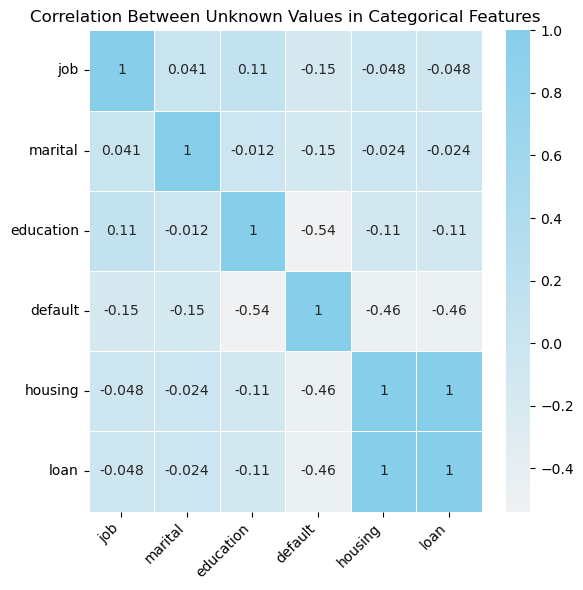

In [9]:
# we create a sub data that contains the rows with unknows values the see if there is correlation 
# or associations between them 

import matplotlib.pyplot as plt
import seaborn as sns

unknown_rows = df[df[features_with_unknown].apply(lambda row: row.isin(['unknown']).any(), axis=1)]
subset_df = unknown_rows[features_with_unknown]
binary_df = subset_df.applymap(lambda x: 1 if x == 'unknown' else 0)
correlation_matrix = binary_df.corr()
cmap = sns.light_palette("skyblue", as_cmap=True)
plt.figure(figsize=(6, 6))
plt.title('Correlation Between Unknown Values in Categorical Features')
sns.heatmap(correlation_matrix, annot=True, cmap=cmap, linewidths=0.5)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


* A correlation coefficient of 1 implies a perfect positive association between features regarding the presence or absence of "unknown" values. This means that whenever one feature has an "unknown" value, the other feature also has an "unknown" value, and vice versa.
* A correlation coefficient of -1 would indicate a perfect negative association, implying that when one feature has an "unknown" value, the other feature does not have an "unknown" value.
* Considering the obtained correlation matrix, we notice a positive association between 'loan' and 'housing', as they have the same percentage of missing values. Additionally, we observe a moderate negative association between 'education' and 'default'.
The percentage of 'Unknown' values in the job distribution is very low (0.8%). This may allow us to consider dropping the rows containing missing values or replacing them with the category 'admin', which has the highest percentage.
Similarly, for marital status, since it has a very low percentage of unknown values, we can replace them with the most common category, which is 'married'.
However, for 'default', we have a very high percentage of missing values (20%). 

### Let's see information Gain for 'default' Feature

**Definition:** In probability theory and information theory, the mutual information (MI) of two random variables is a measure of the mutual dependence between the two variables. More specifically, it quantifies the "amount of information" obtained about one random variable by observing the other random variable. The concept of mutual information is intimately linked to that of entropy of a random variable, a fundamental notion in information theory that quantifies the expected "amount of information" held in a random variable.

**Formula:** The mutual information between variables $X$ and $Y$ is given by:

$$ I(X;Y) = \sum_{x \in X} \sum_{y \in Y} p(x, y) \log\left(\frac{p(x, y)}{p(x) \cdot p(y)}\right) $$

Where $p(x, y)$ is the joint probability mass (or density) function of variables $X$ and $Y$, and $p(x)$ and $p(y)$ are their marginal probability mass (or density) functions, respectively.


In [10]:

from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['default_encoded'] = le.fit_transform(df['default'])
X = df[['default_encoded']]  # Encoded feature
y = df['y']                  # Target variable 'y'

info_gain = mutual_info_classif(X, y, discrete_features=True, random_state=0)
print(f"Information Gain for 'default' feature: {info_gain[0]:.4f}")


Information Gain for 'default' feature: 0.0058


An information gain of 0.0058 suggests that the 'default' feature provides only a small amount of information about the target variable 'y'. Therefore, it is likely beneficial to drop the 'default' column since it adds no significant value.

In [11]:
housing_for_no_loan = df.loc[df['loan'] == 'no', 'housing']
print("Housing categories for 'loan' = 'no':")
print(housing_for_no_loan.value_counts())

Housing categories for 'loan' = 'no':
yes    17885
no     16065
Name: housing, dtype: int64


Housing and loan are associated. If we consider replacing 'unknown' values in housing with the most frequent value, we should note that the corresponding values for 'no' in 'housing' can be either 'yes' or 'no' with almost equal probability. Therefore, we opt to replace the missing values in housing with the most frequent category as well.

**What about education and job ?**  
We can use the chi-square test which is a statistical test used to determine whether there is a significant association between categorical variables in a contingency table.The chi-square statistic (χ²) is calculated based on the differences between observed and expected frequencies in each cell of the contingency table.

In [12]:
import pandas as pd
import scipy.stats as stats
from sklearn.metrics import mutual_info_score

education_counts = df_clean['education'].value_counts()
print("Education Categories and Counts:")
print(education_counts)
education_freq_table = pd.crosstab(index=df_clean['education'], columns='count')
print("\nFrequency Table for Education:")
print(education_freq_table)
job_education_ct = pd.crosstab(index=df_clean['job'], columns=df_clean['education'])
chi2, p, _, _ = stats.chi2_contingency(job_education_ct)
print(f"\nChi-Square Test - p-value: {p}")
mi_score = mutual_info_score(df_clean['education'], df_clean['y'])
print(f"\nMutual Information Score between Education and Target (Y): {mi_score:.4f}")


Education Categories and Counts:
university.degree      12164
high.school             9512
basic.9y                6045
professional.course     5240
basic.4y                4176
basic.6y                2291
unknown                 1730
illiterate                18
Name: education, dtype: int64

Frequency Table for Education:
col_0                count
education                 
basic.4y              4176
basic.6y              2291
basic.9y              6045
high.school           9512
illiterate              18
professional.course   5240
university.degree    12164
unknown               1730

Chi-Square Test - p-value: 0.0

Mutual Information Score between Education and Target (Y): 0.0024


The chi-square test indicates a significant association between education levels and the chosen categorical variable 'job'. This implies that education levels may influence or be related to the distribution of categories in the 'job' feature. Therefore, knowing the job of 'unknown' education levels may help us fill in the missing values.

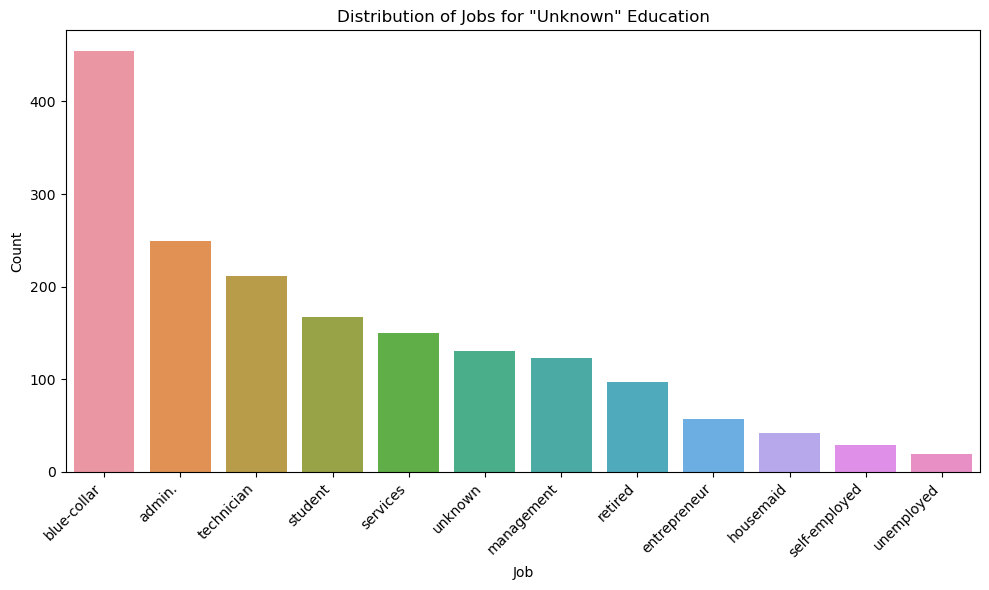

In [13]:

unknown_jobs = df_clean[df_clean['education'] == 'unknown']['job'].value_counts()
plt.figure(figsize=(10, 6))
sns.barplot(x=unknown_jobs.index, y=unknown_jobs.values)
plt.xlabel('Job')
plt.ylabel('Count')
plt.title('Distribution of Jobs for "Unknown" Education')
plt.xticks(rotation=45, ha='right')  
plt.tight_layout()
plt.show()


The term "blue-collar" is used to describe workers who perform manual labor, work at factory jobs, or engage in any other type of labor that does not involve office work. The majority of blue-collar jobs require less education than white-collar jobs, typically equivalent to a high school or junior high school education level. Therefore, we may consider replacing missing values in education with 'basic'.

### Conclusion: Handling missing values in categorical features 

**For education:** 
We will group individuals with only basic education into one category called 'basic'. We will replace the missing values in education with 'basic'.
**colum default:**  We will drop it as it doesn't provide significant added value. \
**Other:**
We will replace missing values with the most redundant category.

In [14]:
df_clean['job'] = df_clean['job'].str.replace('.','')
df_clean['job'] = df_clean['job'].str.replace('-','')
df_clean.loc[df_clean['job'] == 'unknown','job'] = 'admin'

C:\Users\21696\AppData\Local\Temp\ipykernel_20548\3749575078.py:1: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.



In [15]:
#Handling marital unknown values
df_clean['marital'].value_counts()
df_clean.loc[df_clean['marital'] == 'unknown','marital'] = 'married'

In [16]:
#handling education
print(df_clean['education'].value_counts())
df_clean.loc[df_clean['education'].isin(['basic.9y', 'basic.6y', 'basic.4y']), 'education'] = 'basic'
df_clean['education'] = df_clean['education'].str.replace('.', '')
print(df_clean['education'].value_counts())
df_clean.loc[df_clean['education'] == 'unknown', 'education'] = 'basic'

university.degree      12164
high.school             9512
basic.9y                6045
professional.course     5240
basic.4y                4176
basic.6y                2291
unknown                 1730
illiterate                18
Name: education, dtype: int64
basic                 12512
universitydegree      12164
highschool             9512
professionalcourse     5240
unknown                1730
illiterate               18
Name: education, dtype: int64


C:\Users\21696\AppData\Local\Temp\ipykernel_20548\2457301289.py:4: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.



In [17]:
df_clean.drop(columns=['default'],inplace=True)

In [18]:
df_clean.loc[df_clean['housing'] == 'unknown','housing'] = 'yes'

In [19]:
df_clean.loc[df_clean['loan'] == 'unknown','loan'] = 'no'

#### The other categorical data: 

We still have missing values in categorical data, but they are not represented by 'Unknown'. 

**pdays:** 

In [20]:
df_clean['pdays'].value_counts()

999    39661
3        439
6        412
4        118
9         64
2         61
7         60
12        58
10        52
5         46
13        36
11        28
1         26
15        24
14        20
8         18
0         15
16        11
17         8
18         7
22         3
19         3
21         2
25         1
26         1
27         1
20         1
Name: pdays, dtype: int64

As observed, a significant portion of the data (marked as '999') indicates that clients were not previously contacted.

C:\Users\21696\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning:

39.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

C:\Users\21696\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning:

57.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.



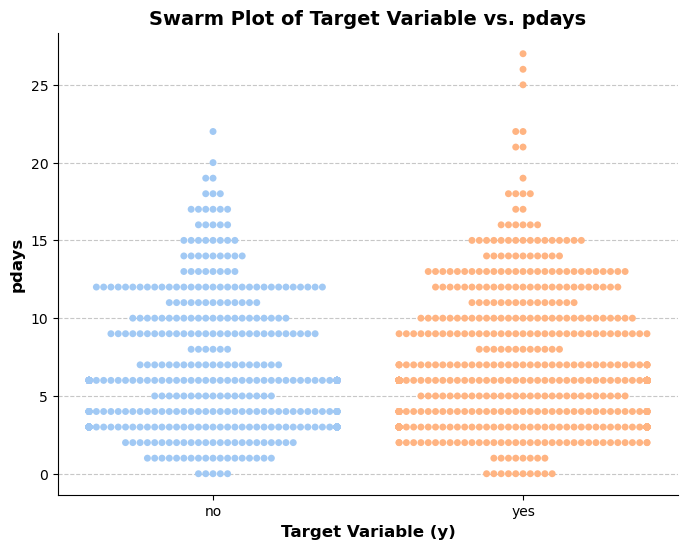

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt
df['pdays'].value_counts()
bank_pdays = df.loc[df['pdays'] == 999, 'y']
bank_pdays.value_counts()
bank_not_pdays = df.loc[df['pdays'] != 999, ['y', 'pdays']]
colors = sns.color_palette("pastel")
plt.figure(figsize=(8, 6))
sns.swarmplot(x='y', y='pdays', data=bank_not_pdays, palette=colors)
plt.xlabel('Target Variable (y)', fontsize=12, fontweight='bold')
plt.ylabel('pdays', fontsize=12, fontweight='bold')
plt.title('Swarm Plot of Target Variable vs. pdays', fontsize=14, fontweight='bold')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
sns.despine()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In the subset of data where clients were contacted previously, constituting a small fraction of the overall dataset, the distribution between 'No' and 'Yes' outcomes is nearly equal. Therefore, this column doesn't significantly contribute to the prediction task and can be dropped from further analysis to streamline the dataset without sacrificing predictive accuracy.

In [22]:
df_clean.drop(columns=['pdays'],inplace=True)

In [23]:
features = df_clean.columns
print(features)

Index(['age', 'job', 'marital', 'education', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'duration', 'campaign', 'previous', 'poutcome',
       'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m',
       'nr.employed', 'y'],
      dtype='object')


#### duration:

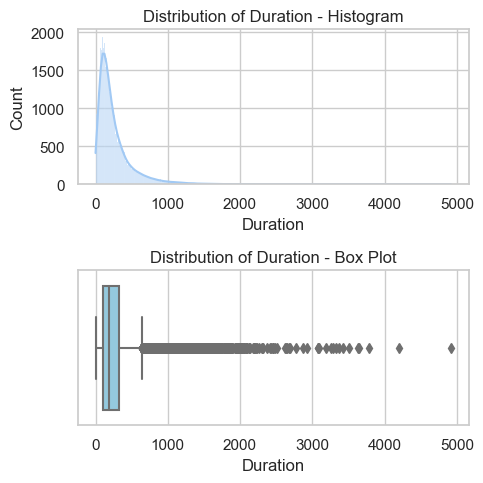

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style and palette
sns.set(style="whitegrid", palette="pastel")

# Create subplots
fig, axes = plt.subplots(2, 1, figsize=(5, 5))

# Histogram plot
sns.histplot(df_clean['duration'], kde=True, ax=axes[0])
axes[0].set_title('Distribution of Duration - Histogram')
axes[0].set_xlabel('Duration')
axes[0].set_ylabel('Count')

# Box plot
sns.boxplot(x='duration', data=df_clean, color='skyblue', ax=axes[1])
axes[1].set_title('Distribution of Duration - Box Plot')
axes[1].set_xlabel('Duration')

# Adjust layout
plt.tight_layout()

# Show plots
plt.show()



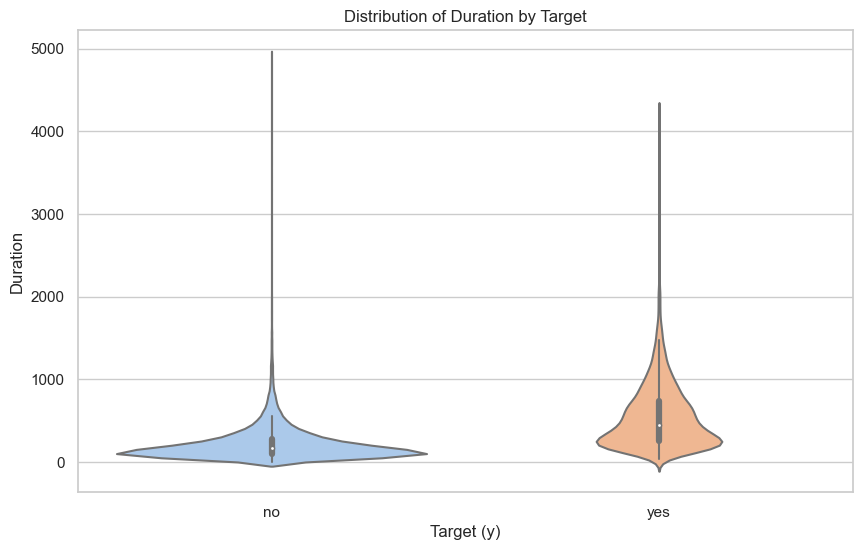

In [25]:
sns.set(style="whitegrid", palette="pastel")
plt.figure(figsize=(10, 6))
sns.violinplot(x='y', y='duration', data=df_clean, palette="pastel")
plt.title('Distribution of Duration by Target')
plt.xlabel('Target (y)')
plt.ylabel('Duration')
plt.show()

Observing the distribution of duration with respect to the target variable, it becomes apparent that when the duration of the call is high, there is a higher likelihood of the target variable ('y') being 'yes'. Conversely, a majority of customers who had a shorter duration of call declined to put the deposit ('y' equal to 'no'). Therefore, it is evident that this feature significantly influences the target variable.

In [26]:
count_duration_zero = (df_clean['duration'] == 0).sum()

print("Number of rows where duration is equal to 0:", count_duration_zero)

Number of rows where duration is equal to 0: 4


In [27]:
duration_zero_rows = df_clean[df_clean['duration'] == 0]
previous_values_duration_zero = duration_zero_rows['previous'].unique()

print("Values of 'previous' for rows where duration is equal to 0:", previous_values_duration_zero)


Values of 'previous' for rows where duration is equal to 0: [0]


These clients are not contacted, as indicated by the 'previous' column being 0, and the duration is equal to 0. Furthermore, there are only 4 such rows, which is a negligible portion of the dataset. Therefore, they are unlikely to significantly contribute to the analysis results. If we intend to assess the effectiveness of the marketing campaign, we should focus on a larger number of rows where both duration and 'previous' are 0. We will drop these rows.

In [28]:
df_clean = df_clean[df_clean['duration'] != 0]

#### contact:

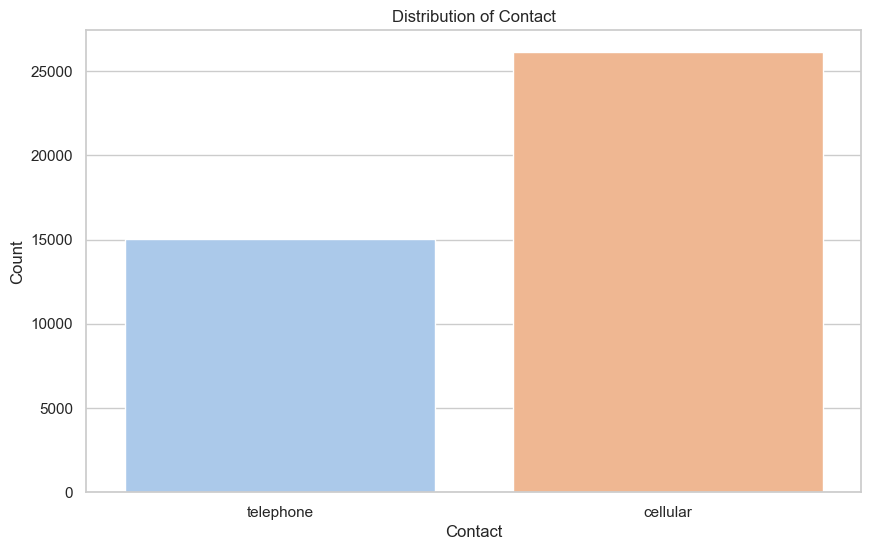

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style and palette
sns.set(style="whitegrid", palette="pastel")

# Create a countplot for the distribution of the categorical feature 'contact'
plt.figure(figsize=(10, 6))
sns.countplot(x='contact', data=df_clean, palette="pastel")
plt.title('Distribution of Contact')
plt.xlabel('Contact')
plt.ylabel('Count')
plt.show()


In [30]:
from scipy.stats import chi2_contingency
import pandas as pd

# Create a contingency table (cross-tabulation) between 'contact' and 'y'
contingency_table = pd.crosstab(df_clean['contact'], df_clean['y'])

# Perform the chi-square test
chi2_stat, p_val, dof, expected = chi2_contingency(contingency_table)

# Print the results
print("Chi-square statistic:", chi2_stat)
print("P-value:", p_val)
print("Degrees of freedom:", dof)
print("Expected frequencies table:")
print(expected)



Chi-square statistic: 862.1789175958168
P-value: 1.6363113179774794e-189
Degrees of freedom: 1
Expected frequencies table:
[[23187.61187215  2944.38812785]
 [13345.38812785  1694.61187215]]


The chi-square statistic measures the discrepancy between the observed frequencies in the contingency table and the expected frequencies if the variables were independent. A higher chi-square statistic indicates a larger discrepancy between the observed and expected frequencies. The chi-square statistic is high (862.18), suggesting a significant difference between the observed and expected frequencies. The p-value is very low (approximately 1.64e-189), well below the commonly chosen threshold of 0.05. This indicates that the observed results are extremely unlikely under the assumption of independence between the variables. Since the p-value is less than the significance threshold, the null hypothesis of independence between the 'contact' and 'y' variables is rejected. Therefore, there is a statistically significant association between these two variables.

#### campaign:

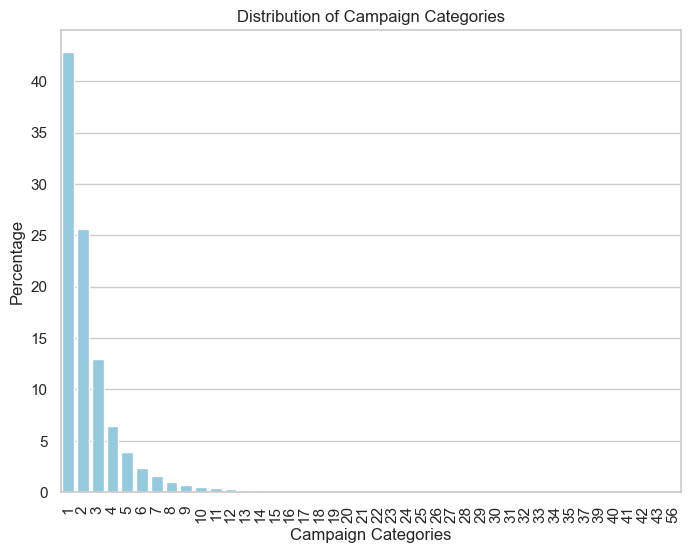

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns
campaign_percentage = df_clean['campaign'].value_counts(normalize=True) * 100
plt.figure(figsize=(8, 6))
sns.barplot(x=campaign_percentage.index, y=campaign_percentage.values, color='skyblue')
plt.title('Distribution of Campaign Categories')
plt.xlabel('Campaign Categories')
plt.ylabel('Percentage')
plt.xticks(rotation=90)
plt.show()


In [32]:
px.violin(df_clean,x='y',y='campaign')

The distribution varies depending on whether 'y' is equal to 'no' or 'yes'. Hence, the number of contacts during the campaign affects 'y'. Additionally, there is a significant presence of outliers for 'y' equal to 'no'

**poutcome:**

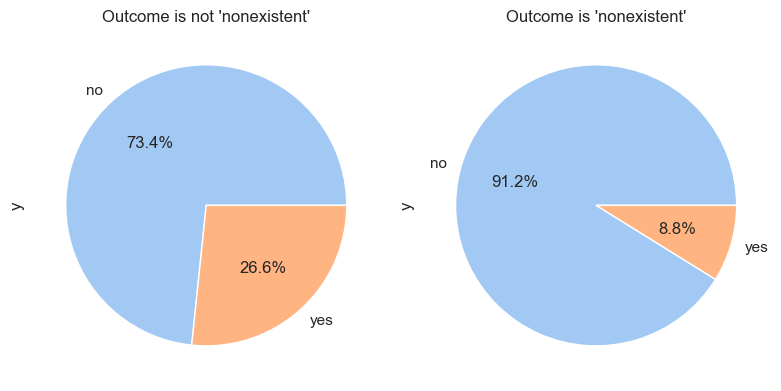

In [33]:
colors = sns.color_palette("pastel")
plt.figure(figsize=(8, 5))

plt.subplot(121)
bank_not_nonexistent = df_clean.loc[df_clean['poutcome'] != 'nonexistent', 'y'].value_counts()
bank_not_nonexistent.plot(kind='pie', autopct='%1.1f%%', colors=colors)
plt.title("Outcome is not 'nonexistent'")

plt.subplot(122)
bank_nonexistent = df_clean.loc[df_clean['poutcome'] == 'nonexistent', 'y'].value_counts()
bank_nonexistent.plot(kind='pie', autopct='%1.1f%%', colors=colors)
plt.title("Outcome is 'nonexistent'")

plt.tight_layout()
plt.show()



When the outcome is 'nonexistent,' the proportion of 'no' increases significantly, jumping from 73% to 91%. Therefore, we cannot delete this column as the missing values have a noticeable effect on the results.

**previous:**

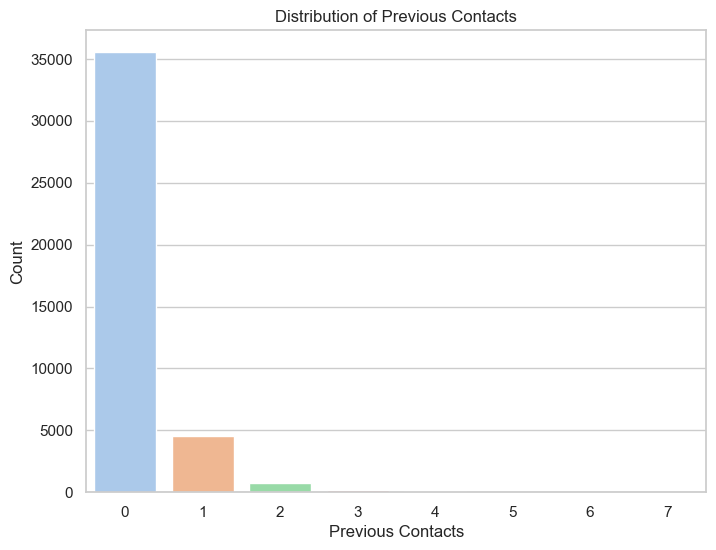

In [34]:
sns.set_palette("pastel")
plt.figure(figsize=(8, 6))
sns.countplot(x='previous', data=df_clean)
plt.title('Distribution of Previous Contacts')
plt.xlabel('Previous Contacts')
plt.ylabel('Count')
plt.show()

A significant portion of customers did not have previous calls. Therefore, it is crucial to ascertain whether the number of previous calls affected the results or not to determine whether we should retain or remove the column.

In [35]:
import plotly.express as px

bank_not_previous = df_clean[df_clean['previous'] != 0]
bank_previous = df_clean[df_clean['previous'] == 0]

fig = px.violin(bank_not_previous, x='y', y='previous', box=True, points='all', title="Violin Plot of Target Variable vs. customers who had previous calls", violinmode='overlay')
fig.update_traces(marker=dict(color='lightblue', size=4), line=dict(color='blue'))
fig.show()

fig = px.histogram(bank_previous, x='y', title="Count Plot of Target Variable vs. no previous calls", color='y')
fig.update_traces(marker=dict(color='lightblue'))
fig.show()


In [36]:
bnp = bank_not_previous['y'].value_counts()
print(bnp['yes']/bnp['no'])
bp = bank_previous['y'].value_counts()
print(bp['yes']/bp['no'])

0.36330586524478914
0.09689264665041504


As it seems there is a difference in the output. 

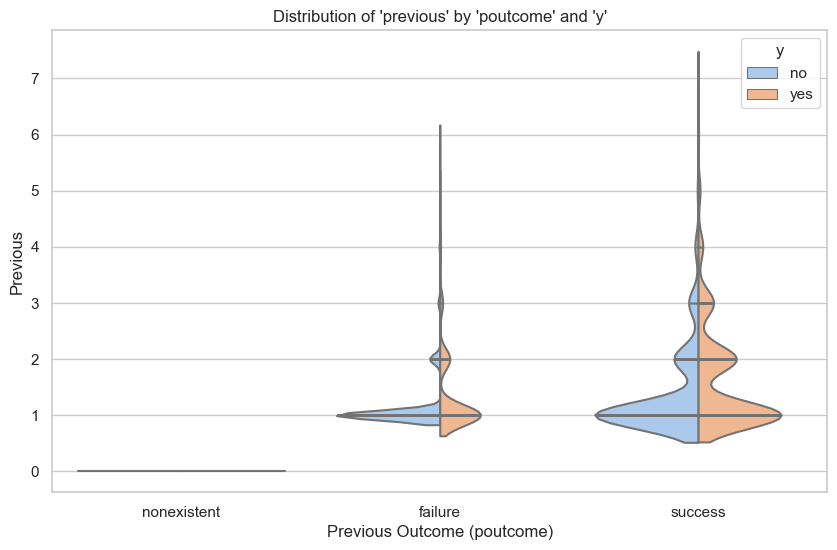

In [37]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a violin plot using seaborn
plt.figure(figsize=(10, 6))
sns.violinplot(data=df_clean, x="poutcome", y="previous", hue="y",
               split=True, palette="pastel", inner="stick")
plt.title("Distribution of 'previous' by 'poutcome' and 'y'")
plt.xlabel('Previous Outcome (poutcome)')
plt.ylabel('Previous')
plt.legend(title='y', loc='upper right')
plt.show()


Analysis suggests that the variable 'previous' has an impact on the outcome 'y', indicating that individuals who have had more contacts before the campaign are more likely to subscribe to the service. This observation implies that retaining the column 'previous', representing the number of contacts performed before the current campaign, could be valuable in predicting subscription outcomes or understanding customer behavior and preferences.

# Explatory Data Analysis

## Distribution

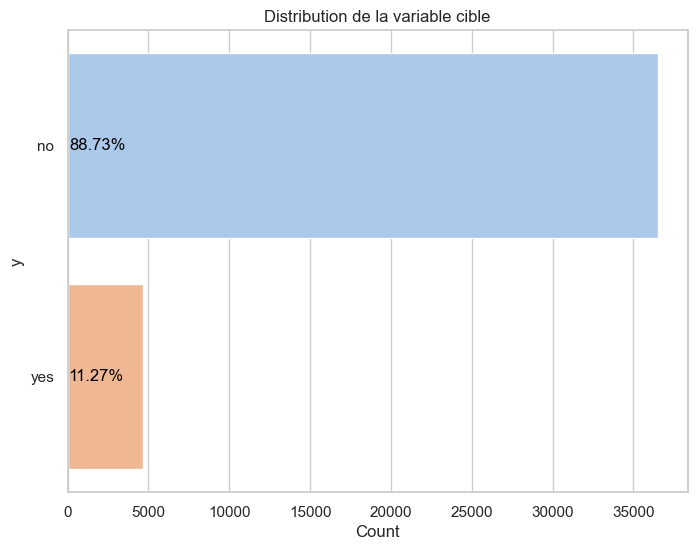

In [38]:

category_counts = df_clean['y'].value_counts(normalize=True) * 100

sns.set_palette("pastel")

plt.figure(figsize=(8, 6))
ax = sns.countplot(y='y', data=df_clean, palette="pastel")
plt.title('Distribution de la variable cible')
plt.xlabel('Count')
plt.ylabel('y')
for i, count in enumerate(category_counts):
    ax.text(count + 1, i, f'{count:.2f}%', va='center', color='black')

plt.show()



We notice that our data is imbalanced, with 88.73% of the observations having 'y' equal to 'no'. This suggests that we need to employ methods to balance our data before training our models

#### Let's see which are the correlated numerical features:

To observe the correlation of numerical features with the target variable 'y', it's essential to convert 'y' into a numerical variable. Typically, in binary classification tasks, the target variable 'y' represents two classes, often labeled as '0' and '1'.

In [39]:
df_clean['y'] = df_clean['y'].map({'yes': 1, 'no': 0})

The Pearson correlation measures the strength of the linear relationship between two variables. It has a value between -1 to 1, with a value of -1 meaning a total negative linear correlation, 0 being no correlation, and + 1 meaning a total positive correlation.

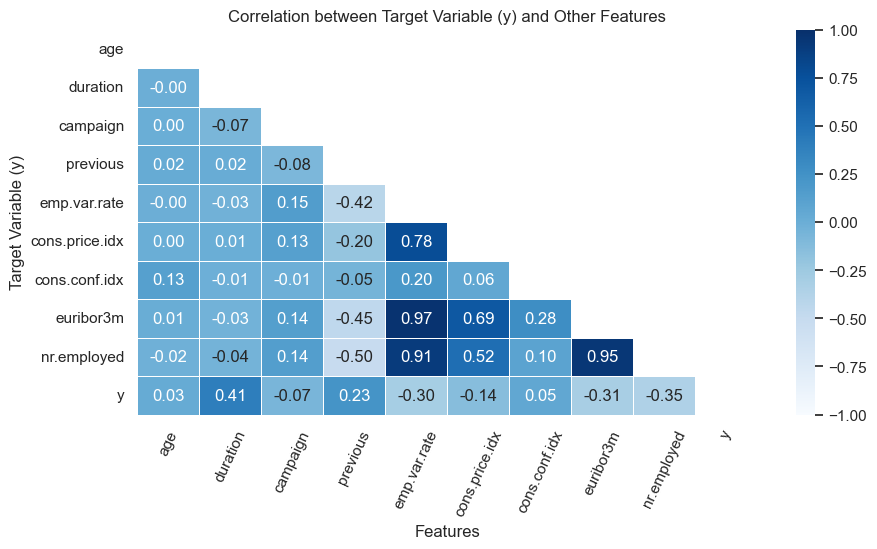

In [40]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 5))

df_corr = df_clean.corr(method='pearson')
mask = np.zeros_like(df_corr)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(data=df_corr, vmin=-1, vmax=1, mask=mask, 
            cmap='Blues',  # Using blue colormap
            annot=True, fmt='.2f', linewidths=.5, ax=ax)

ax.set_xticklabels(ax.get_xticklabels(), rotation=65)
plt.title('Correlation between Target Variable (y) and Other Features')
plt.xlabel('Features')
plt.ylabel('Target Variable (y)')
plt.show()


The numerical features most correlated with 'y' are:

In [41]:
numerical_features_corr_with_y = df_clean.select_dtypes(include='number').corr()['y'].abs().sort_values(ascending=False)
most_correlated_numerical_features = numerical_features_corr_with_y[1:6]  # Assuming 'y' is the first entry, so excluding it
print("The most correlated numerical features with 'y' are:")
print(most_correlated_numerical_features)


The most correlated numerical features with 'y' are:
duration        0.405285
nr.employed     0.354688
euribor3m       0.307768
emp.var.rate    0.298313
previous        0.230192
Name: y, dtype: float64


The analysis reveals that duration exhibits the highest correlation with 'y'. This underscores the significance of this feature and prompts us to explore its relationship with other features. Additionally, it suggests the potential importance of time-related features in our analysis.Social and economic context features also hold significance, which is logical given that the data was collected during a period of financial crisis.

In [42]:
correlation_matrix = df_clean.corr()

significant_correlations = correlation_matrix[(correlation_matrix > 0.3) & (correlation_matrix < 1.0)]
significant_correlations = significant_correlations.dropna(axis=0, how='all').dropna(axis=1, how='all')

significant_correlations_table = pd.DataFrame(significant_correlations.stack())

significant_correlations_table.reset_index(inplace=True)
significant_correlations_table.columns = ['Feature 1', 'Feature 2', 'Correlation']

print(significant_correlations_table)


         Feature 1       Feature 2  Correlation
0         duration               y     0.405285
1     emp.var.rate  cons.price.idx     0.775290
2     emp.var.rate       euribor3m     0.972241
3     emp.var.rate     nr.employed     0.906945
4   cons.price.idx    emp.var.rate     0.775290
5   cons.price.idx       euribor3m     0.688167
6   cons.price.idx     nr.employed     0.521931
7        euribor3m    emp.var.rate     0.972241
8        euribor3m  cons.price.idx     0.688167
9        euribor3m     nr.employed     0.945146
10     nr.employed    emp.var.rate     0.906945
11     nr.employed  cons.price.idx     0.521931
12     nr.employed       euribor3m     0.945146
13               y        duration     0.405285


Considering the period of financial crisis during which the data was collected, it's logical that social and economic context features also hold significance.

The global financial crisis that began in 2008 can be summarized into three main phases:

1. **2008: Banking System Seizure**
The crisis escalated on September 15, 2008, when Lehman Brothers, a major investment bank, declared bankruptcy, challenging the notion that all banks were "too big to fail." Governments responded by injecting substantial capital into banks to avert collapse, but the global economy plunged into a period of freefall.

2. **2009: Coordinated Global Response**
In early 2009, amid the global financial crisis, G20 nations collaborate to forestall recession from escalating into a depression. A pivotal moment occurs on April 2, 2009, during the London G20 summit, where world leaders pledge to implement a $5 trillion fiscal expansion, enhance resources for international institutions, and undertake bank reforms. However, this period also marks the onset of diminishing international cooperation as countries increasingly prioritize individual agendas over collective action.
3. **2010: Sovereign Debt Crisis**
   On May 9, 2010, attention transitions from the private sector to the public sector as governments grapple with escalating budget deficits. Greece's receipt of financial aid from the IMF and EU underscores apprehensions regarding government solvency. Consequently, austerity measures gain prominence, influencing policy decisions across multiple nations.


These phases illustrate the progression of the crisis from its origins in the banking system to broader economic impacts and concerns about sovereign debt.

##### Since our data is ordered by date (from May 2008 to November 2010), we can create a new column named "year" because the year may influence in this case.








In [43]:
months_arr = []
for i in range(df_clean.shape[0]):
    
    if months_arr != [] and months_arr[-1][1] == df_clean.iloc[i]['month']:
        continue
    else:
        months_arr.append([i, df_clean.iloc[i]['month']])

months_arr = np.array(months_arr)
months_arr


array([['0', 'may'],
       ['7761', 'jun'],
       ['12135', 'jul'],
       ['18816', 'aug'],
       ['23988', 'oct'],
       ['24055', 'nov'],
       ['27670', 'dec'],
       ['27680', 'mar'],
       ['27962', 'apr'],
       ['30418', 'may'],
       ['36210', 'jun'],
       ['36925', 'jul'],
       ['37102', 'aug'],
       ['37872', 'sep'],
       ['38139', 'oct'],
       ['38585', 'nov'],
       ['38942', 'dec'],
       ['39114', 'mar'],
       ['39378', 'apr'],
       ['39552', 'may'],
       ['39764', 'jun'],
       ['39993', 'jul'],
       ['40304', 'aug'],
       ['40537', 'sep'],
       ['40840', 'oct'],
       ['41044', 'nov']], dtype='<U11')

In [44]:
df_clean['year'] = np.hstack((np.array([2008] * (27962 - 0)),
                        np.array([2009] * (39378 - 27962)),
                        np.array([2010] * (41172 - 39378))))

In [45]:
df_clean.columns

Index(['age', 'job', 'marital', 'education', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'duration', 'campaign', 'previous', 'poutcome',
       'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m',
       'nr.employed', 'y', 'year'],
      dtype='object')

*Let's analyze the bank client data first and then revisit the time-related features and social and economic indicators.*

### Bank Client Data: 

y                0     1  Total  Percentage_0  Percentage_1
job                                                        
admin         9360  1388  10748     87.085969     12.914031
bluecollar    8613   638   9251     93.103448      6.896552
entrepreneur  1332   124   1456     91.483516      8.516484
housemaid      954   106   1060     90.000000     10.000000
management    2595   328   2923     88.778652     11.221348
retired       1284   434   1718     74.738068     25.261932
selfemployed  1272   149   1421     89.514426     10.485574
services      3644   323   3967     91.857827      8.142173
student        600   275    875     68.571429     31.428571
technician    6009   730   6739     89.167532     10.832468
unemployed     870   144   1014     85.798817     14.201183


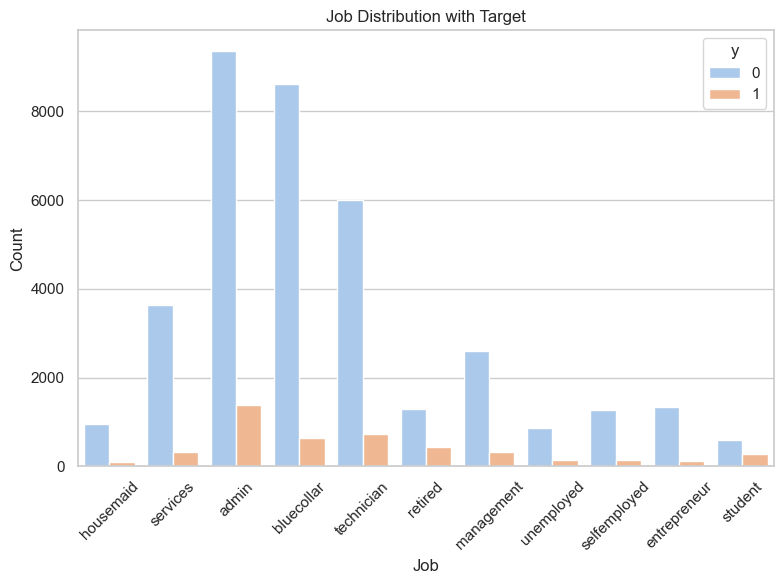

y             0     1  Total  Percentage_0  Percentage_1
marital                                                 
divorced   4134   476   4610     89.674620     10.325380
married   22455  2543  24998     89.827186     10.172814
single     9944  1620  11564     85.991007     14.008993


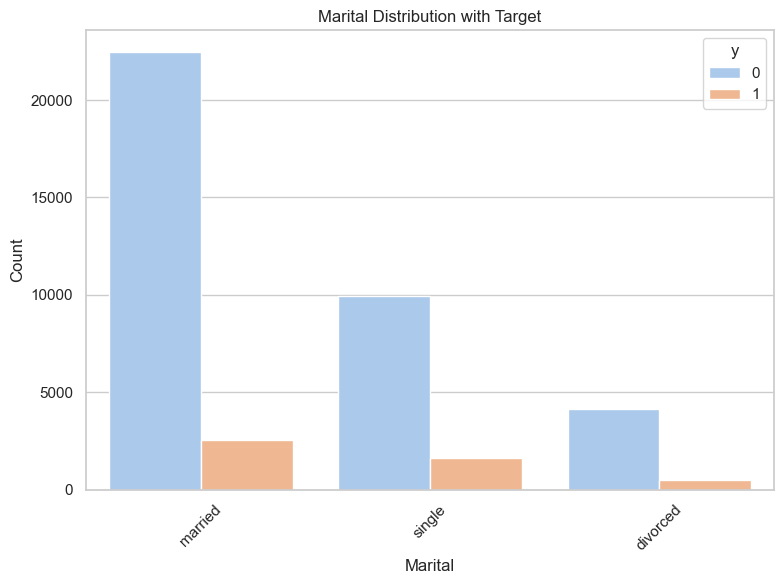

y                       0     1  Total  Percentage_0  Percentage_1
education                                                         
basic               12901  1340  14241     90.590548      9.409452
highschool           8479  1031   9510     89.158780     10.841220
illiterate             14     4     18     77.777778     22.222222
professionalcourse   4645   595   5240     88.645038     11.354962
universitydegree    10494  1669  12163     86.278056     13.721944


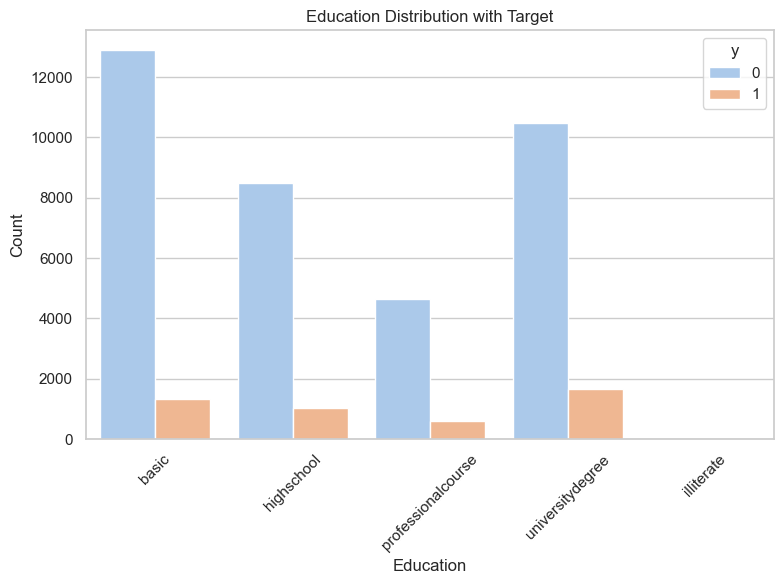

y            0     1  Total  Percentage_0  Percentage_1
housing                                                
no       16589  2025  18614     89.121092     10.878908
yes      19944  2614  22558     88.412093     11.587907


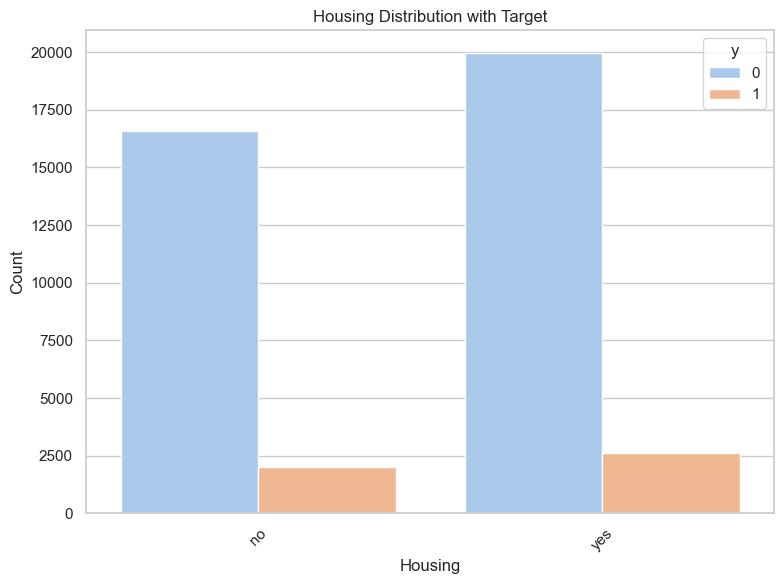

y         0     1  Total  Percentage_0  Percentage_1
loan                                                
no    30968  3956  34924     88.672546     11.327454
yes    5565   683   6248     89.068502     10.931498


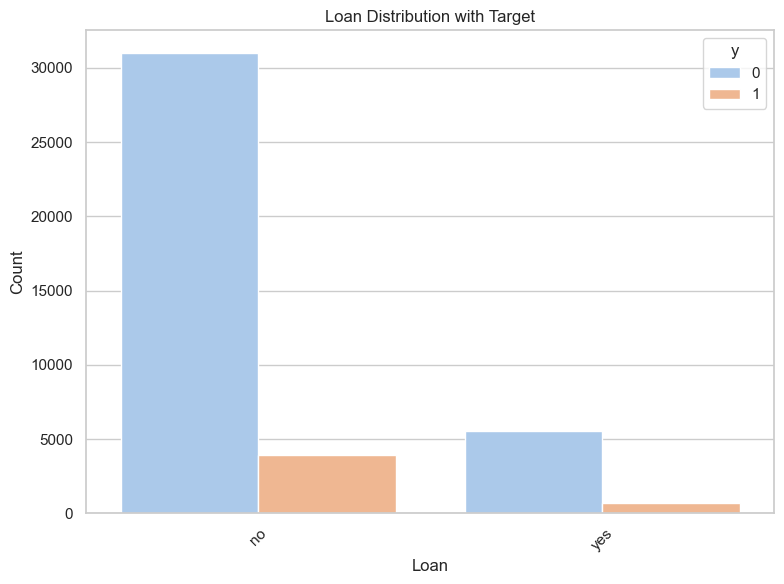

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_categorical_with_percentages(feature, df):
    plt.figure(figsize=(8, 6))
    
    # Countplot
    sns.countplot(x=feature, hue="y", data=df, palette="pastel")
    plt.title(f'{feature.capitalize()} Distribution with Target')
    plt.xlabel(feature.capitalize())
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    
    # Calculate total counts for each category
    category_counts = df.groupby(feature)['y'].value_counts().unstack(fill_value=0)
    
    # Calculate percentages
    category_counts['Total'] = category_counts.sum(axis=1)
    category_counts['Percentage_0'] = (category_counts[0] / category_counts['Total']) * 100
    category_counts['Percentage_1'] = (category_counts[1] / category_counts['Total']) * 100

    # Print results
    print(category_counts)
    
    # Annotate percentages for each category
    for idx, counts in category_counts.iterrows():
        total = counts['Total']
        for p in plt.gca().patches:
            if idx == p.get_x():
                height = p.get_height()
                plt.gca().annotate(f'Total: {total}\n%_0: {counts["Percentage_0"]:.2f}%\n%_1: {counts["Percentage_1"]:.2f}%', 
                                    (p.get_x() + p.get_width() / 2., height), ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

# Example usage:
plot_categorical_with_percentages("job", df_clean)
plot_categorical_with_percentages("marital", df_clean)
plot_categorical_with_percentages("education", df_clean)
plot_categorical_with_percentages("housing", df_clean)
plot_categorical_with_percentages("loan", df_clean)



In [47]:
def analyze(df, feature1, feature2, target_feature):
    plt.figure(figsize=(15, 6))
    
    # Histogram of the numerical feature distribution with density line
    plt.subplot(1, 2, 1)
    sns.histplot(df[target_feature], bins=20, kde=True, color='skyblue', line_kws={'linewidth': 2})
    plt.title(f'Distribution of {target_feature}')
    plt.xlabel(target_feature)
    plt.ylabel('Density')
    plt.tight_layout()
    
    # Plot median of numerical feature by the categorical features
    plt.subplot(1, 2, 2)
    sns.boxplot(x=feature1, y=target_feature, hue=feature2, data=df, palette='Set2')
    plt.title(f'Median {target_feature} by {feature1} and {feature2}')
    plt.xlabel(feature1)
    plt.ylabel(f'Median {target_feature}')
    plt.xticks(rotation=45)
    
    plt.show()




#### age: 

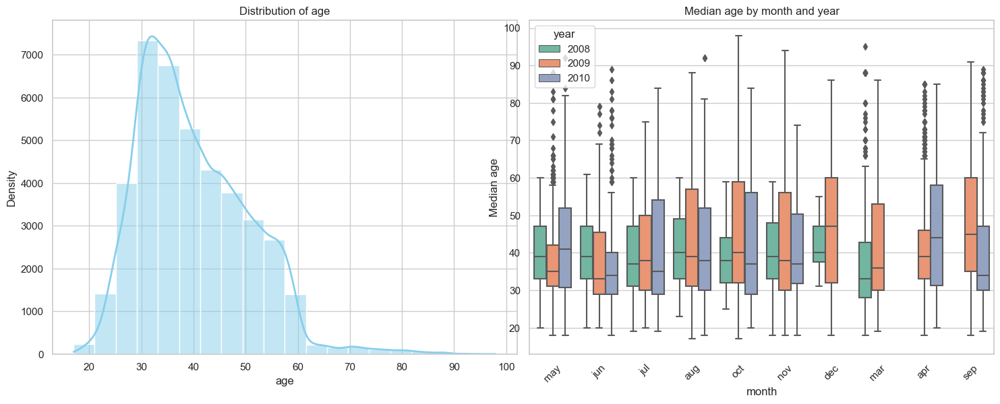

In [48]:
analyze(df_clean, 'month', 'year', 'age')

* The highest percentages of making a deposit are with retirees and students, despite not constituting a large portion of clients. Conversely, blue-collar workers have the lowest percentage. A blue-collar worker is a working-class person who performs manual labor or skilled trades.
* Administrators are the most contacted group of people.
* Married individuals are the most engaged with the campaign; however, singles are more likely to make a deposit.
* Illiterate individuals have the highest percentage of depositors, although they are in the minority. The higher the level of education, the more likely individuals are to make a deposit.
* The presence of a housing loan does not seem to significantly influence the results, as the percentages are similar.
* The age distribution is right-skewed, with the majority of adherents being adults aged between 30 and 50. Outliers are also observed.


#### Cramer’s Correlation
Cramer’sV correlation is used to measure the association between two attributes and its value varies from 0( stating no relationship between the attributes) to 1 (stating complete association between variables). It reaches a value of 1 only when an attribute is completely determined by the other attribute.

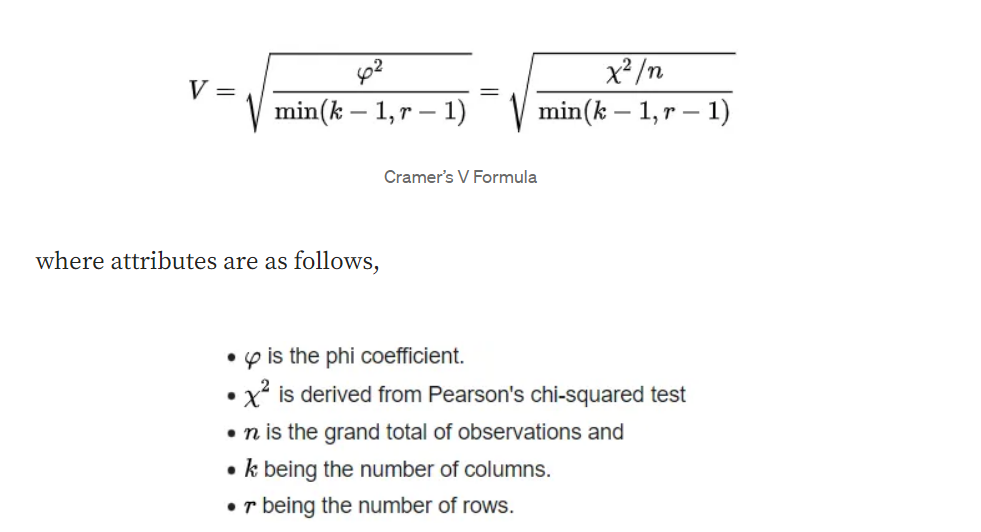

In [49]:
from scipy.stats import chi2_contingency

def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

# Example usage:
categorical_features = ['job', 'marital', 'education', 'housing', 'loan']
corr_matrix = pd.DataFrame(index=categorical_features, columns=categorical_features)

for i in range(len(categorical_features)):
    for j in range(len(categorical_features)):
        corr_matrix.iloc[i, j] = cramers_v(df_clean[categorical_features[i]], df_clean[categorical_features[j]])




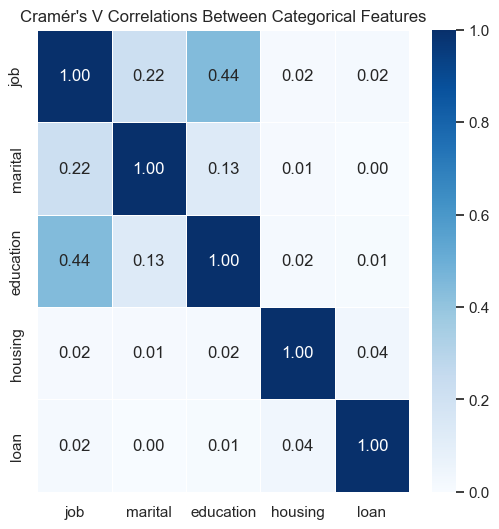

In [50]:
corr_matrix = corr_matrix.astype(float)

# Plot heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(corr_matrix, annot=True, cmap="Blues", fmt=".2f", linewidths=0.5)
plt.title("Cramér's V Correlations Between Categorical Features")
plt.show()

As expected, there is a notable correlation between job and education, which aligns with the observed results. However, there are no significant correlations between the other features.

### Related with the last contact of the current campaign:

* contact: contact communication type (categorical)
* month: last contact month of year (categorical)
* day_of_week: last contact day of the week (categorical)
* duration: last contact duration, in seconds (numeric) highly affects 'y'

y              0     1  Total  Percentage_0  Percentage_1
contact                                                  
cellular   22280  3852  26132     85.259452     14.740548
telephone  14253   787  15040     94.767287      5.232713


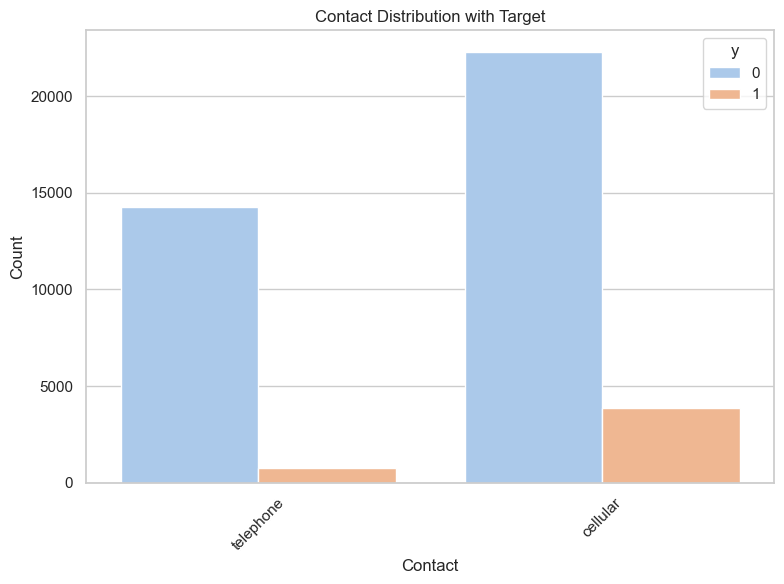

y          0    1  Total  Percentage_0  Percentage_1
month                                               
apr     2091  539   2630     79.505703     20.494297
aug     5520  655   6175     89.392713     10.607287
dec       93   89    182     51.098901     48.901099
jul     6521  648   7169     90.961082      9.038918
jun     4759  559   5318     89.488530     10.511470
mar      270  276    546     49.450549     50.549451
may    12879  886  13765     93.563385      6.436615
nov     3684  416   4100     89.853659     10.146341
oct      402  315    717     56.066946     43.933054
sep      314  256    570     55.087719     44.912281


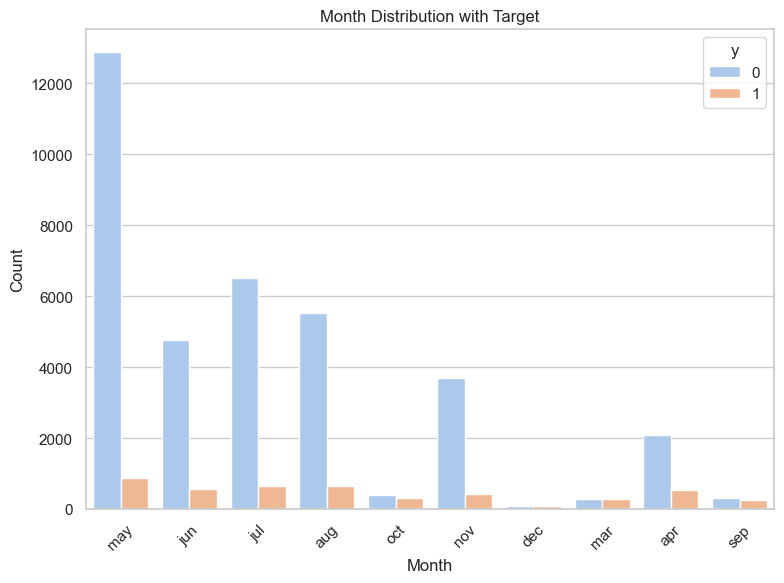

y               0     1  Total  Percentage_0  Percentage_1
day_of_week                                               
fri          6979   846   7825     89.188498     10.811502
mon          7664   847   8511     90.048173      9.951827
thu          7574  1044   8618     87.885820     12.114180
tue          7131   953   8084     88.211282     11.788718
wed          7185   949   8134     88.332924     11.667076


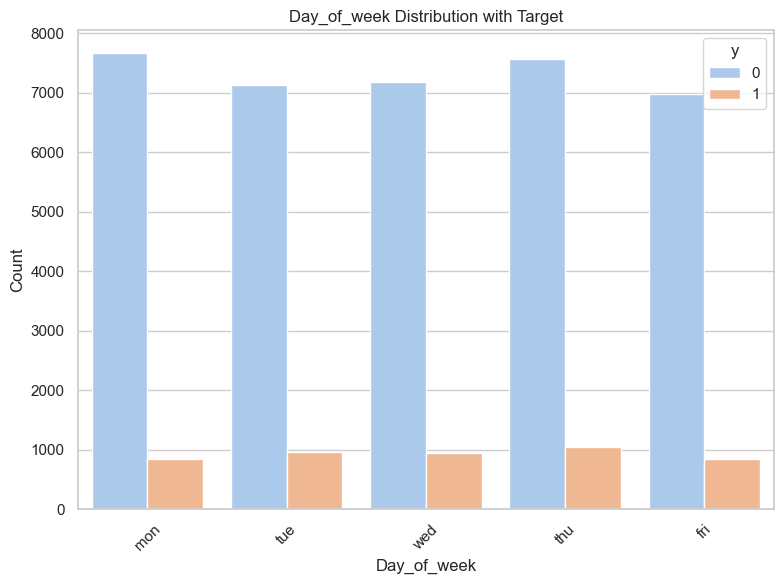

y         0     1  Total  Percentage_0  Percentage_1
year                                                
2008  26497  1465  27962     94.760747      5.239253
2009   9165  2251  11416     80.282060     19.717940
2010    871   923   1794     48.550725     51.449275


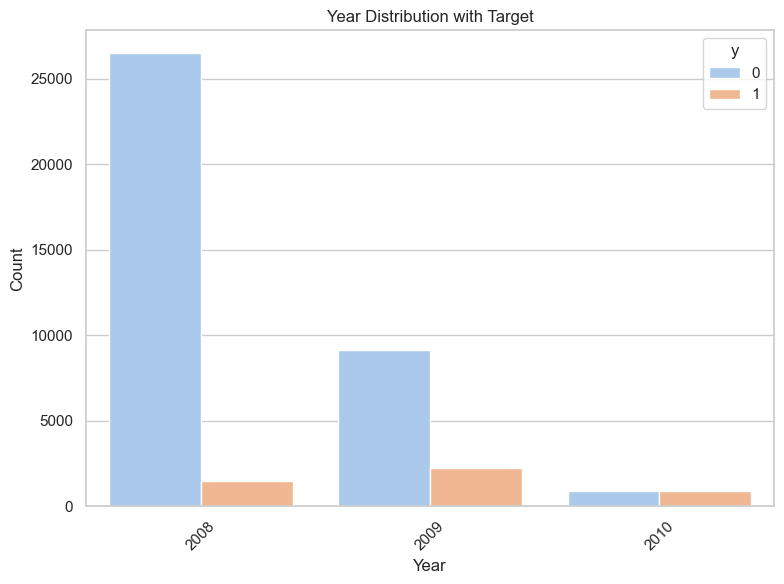

In [51]:
plot_categorical_with_percentages("contact", df_clean)
plot_categorical_with_percentages("month", df_clean)
plot_categorical_with_percentages("day_of_week", df_clean)
plot_categorical_with_percentages("year", df_clean)

Considering the years, we observe nearly four times as many individuals making a deposit in 2009 compared to 2008. In terms of months, May stands out with the highest number of contacts, although it yields poor results for deposits. Conversely, December, October, and September exhibit significantly lower contacts, with almost 50% making a deposit, which is suspicious. Similarly, when considering the days of the week, there is no significant difference observed. However, it's noteworthy that the majority of contacts were made using cellular communication.

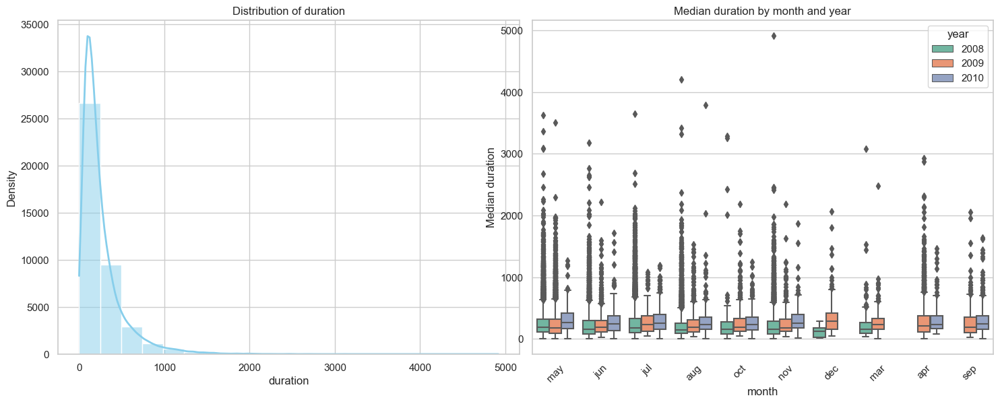

In [52]:
analyze(df_clean, 'month', 'year', 'duration')

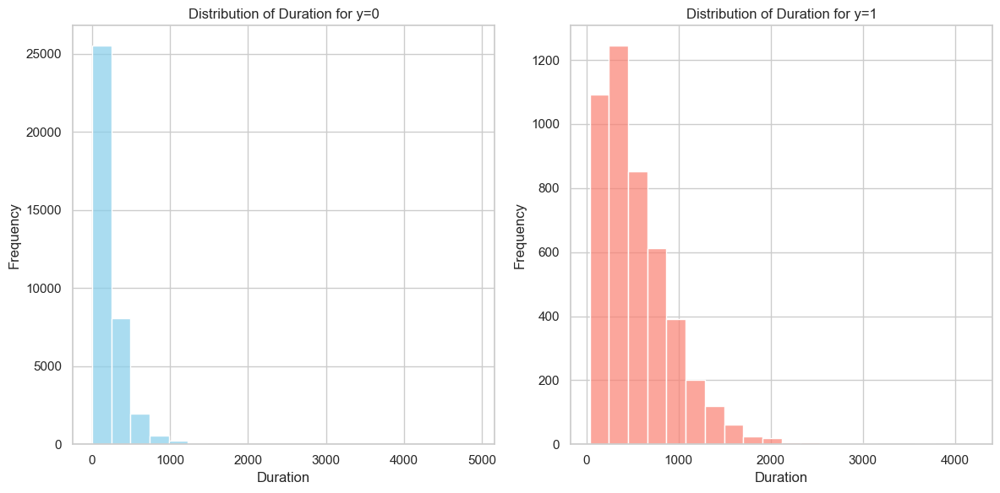

In [53]:
plt.figure(figsize=(12, 6))

# Plot for y=0
plt.subplot(1, 2, 1)
sns.histplot(data=df_clean[df_clean['y'] == 0], x='duration', bins=20, color='skyblue', alpha=0.7)
plt.title('Distribution of Duration for y=0')
plt.xlabel('Duration')
plt.ylabel('Frequency')

# Plot for y=1
plt.subplot(1, 2, 2)
sns.histplot(data=df_clean[df_clean['y'] == 1], x='duration', bins=20, color='salmon', alpha=0.7)
plt.title('Distribution of Duration for y=1')
plt.xlabel('Duration')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


The longer the duration of the call, the more likely it is to result in a deposit.Longer conversations may indicate a deeper level of engagement or interest from the client, which could lead to a successful outcome such as a deposit.

### Other attributes:

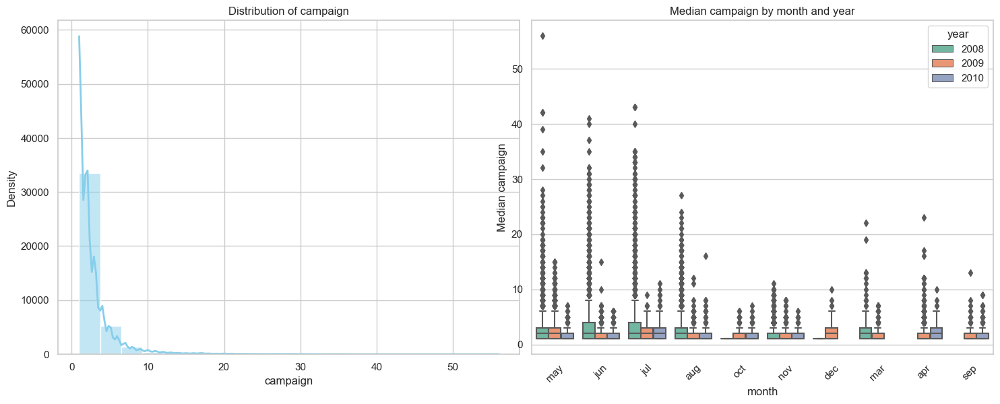

In [54]:
analyze(df_clean, 'month', 'year', 'campaign')

In [55]:
campaign_median = df_clean['campaign'].median()
print("Median of the 'campaign' feature:", campaign_median)


Median of the 'campaign' feature: 2.0


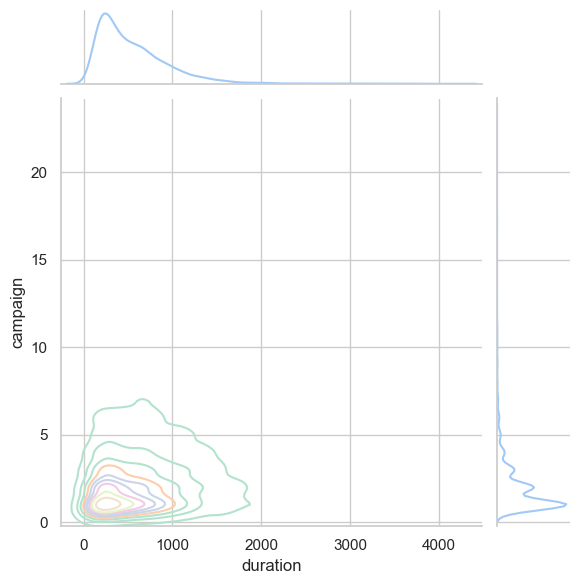

In [56]:
# Filter the data where y == 1
df_clean_y1 = df_clean[df_clean['y'] == 1]

# Plot the jointplot
sns.jointplot(x='duration', y='campaign', data=df_clean_y1, kind='kde', cmap="Pastel2")


* both distributions are skewed tot he right and suggests that there is a positive skewness in the data, meaning that there are relatively few instances of very high values compared to the majority of lower values. In the jointplot, where both distributions have their peaks in the same place, it indicates that there is a positive correlation between the duration of the call and the number of times a client has been contacted during the campaign.
* Clients who are contacted more frequently during the campaign tend to have longer call durations.
* Skewed right distribution for duration means that there are relatively few calls with very long durations, indicating that most calls have shorter durations but some have significantly longer durations.(outliers) 

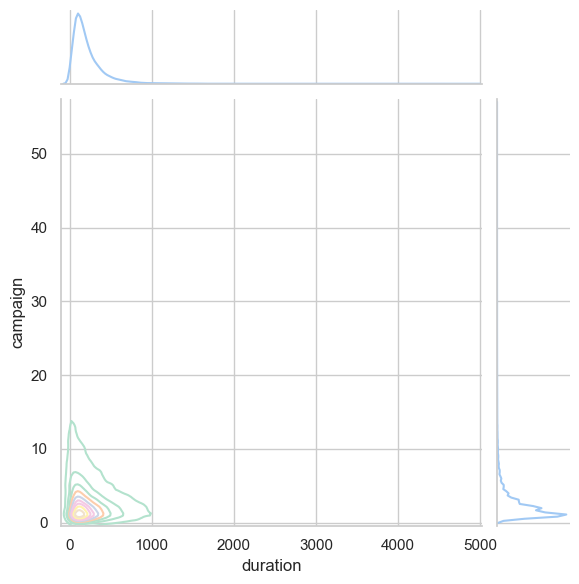

In [57]:
# Filter the data where y == 0
df_clean_y1 = df_clean[df_clean['y'] == 0]

# Plot the jointplot
sns.jointplot(x='duration', y='campaign', data=df_clean_y1, kind='kde', cmap="Pastel2")

We obtain similar results, although with lower values for both features.

C:\Users\21696\anaconda3\lib\site-packages\pandas\core\arrays\categorical.py:2747: FutureWarning:

The `inplace` parameter in pandas.Categorical.set_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.



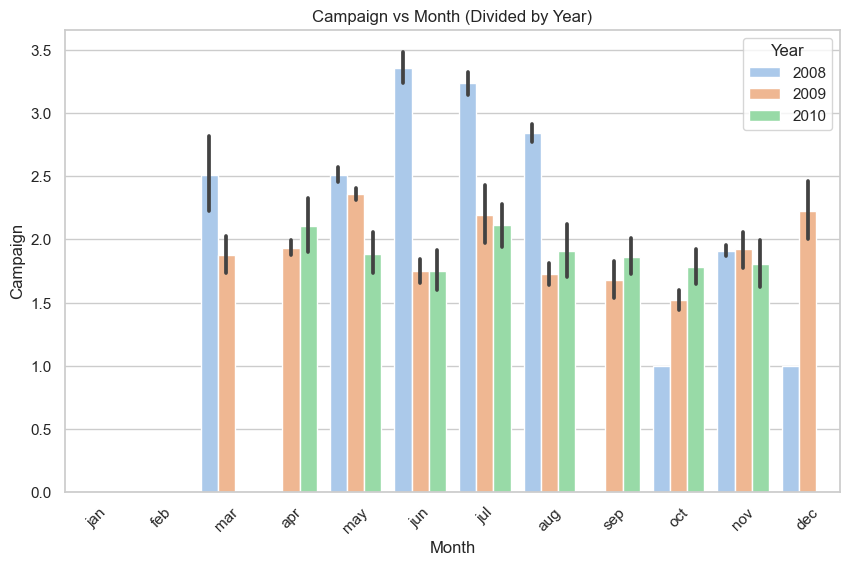

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the order of the months
sort_order = ['jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec']

# Convert the 'month' column to categorical and set the sort order
df_clean['month'] = df_clean['month'].astype("category")
df_clean['month'].cat.set_categories(sort_order, inplace=True)

# Plot the bar chart with hue for year
plt.figure(figsize=(10, 6))
sns.barplot(x='month', y='campaign', hue='year', data=df_clean, palette='pastel')
plt.xlabel('Month')
plt.ylabel('Campaign')
plt.title('Campaign vs Month (Divided by Year)')
plt.xticks(rotation=45)
plt.legend(title='Year')
plt.show()


We observe the highest number of contacts in June, July, and August, particularly in 2008. However, in 2008, only 5% of contacts resulted in a positive outcome (y=1). Considering the presence of outliers, it's worth investigating whether these outliers correspond to individuals who made a deposit in the end.

In [59]:
# Filter the data
filtered_data = df_clean[(df_clean['campaign'] > 2) & 
                         (df_clean['month'].isin(['jun', 'jul', 'aug'])) & 
                         (df_clean['year'] == 2008)]

# Get the count of people satisfying the criteria
count_satisfying_criteria = len(filtered_data)

# Get the count of people not satisfying the criteria in 2008
count_not_satisfying_criteria_2008 = len(df_clean[(df_clean['year'] == 2008)]) - count_satisfying_criteria

# Calculate percentages
percentage_satisfying_criteria = (count_satisfying_criteria / len(df_clean[df_clean['year'] == 2008])) * 100
percentage_not_satisfying_criteria_2008 = (count_not_satisfying_criteria_2008 / len(df_clean[df_clean['year'] == 2008])) * 100

# Print the percentages
print("Percentage of people satisfying the criteria in 2008:", round(percentage_satisfying_criteria, 2), "%")
print("Percentage of people not satisfying the criteria in 2008:", round(percentage_not_satisfying_criteria_2008, 2), "%")



Percentage of people satisfying the criteria in 2008: 23.32 %
Percentage of people not satisfying the criteria in 2008: 76.68 %


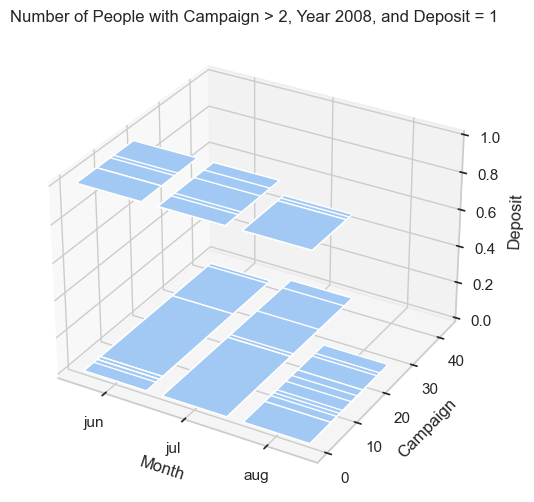

In [60]:
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')

# Plot the count
ax.bar(filtered_data['month'], filtered_data['campaign'], filtered_data['y'])

# Set labels and title
ax.set_xlabel('Month')
ax.set_ylabel('Campaign')
ax.set_zlabel('Deposit')
ax.set_title('Number of People with Campaign > 2, Year 2008, and Deposit = 1')

plt.show()

It appears that these outliers did not actually make any deposits.

##### previous and poutcome:

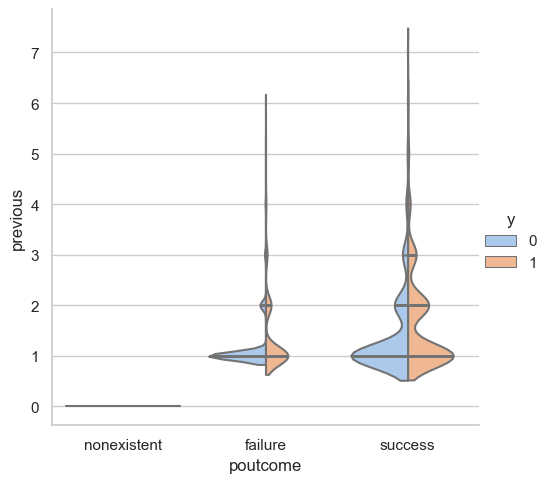

In [61]:
sns.catplot(
    data=df_clean, x="poutcome", y="previous", hue="y",
    kind="violin", inner="stick", split=True, palette="pastel",
)

In [62]:
# Create a DataFrame to store the counts and percentages
poutcome_matrix = pd.DataFrame(index=['y=0', 'y=1'], columns=['poutcome=failure', 'poutcome=success'])

# Count the occurrences for each combination
for outcome in ['failure', 'success']:
    for response in [0, 1]:
        count = df_clean[(df_clean['y'] == response) & (df_clean['poutcome'] == outcome)].shape[0]
        poutcome_matrix.loc[f'y={response}', f'poutcome={outcome}'] = count

# Calculate the percentages
poutcome_matrix['poutcome=failure'] /= df_clean[df_clean['poutcome'] == 'failure'].shape[0]
poutcome_matrix['poutcome=success'] /= df_clean[df_clean['poutcome'] == 'success'].shape[0]

# Display the matrix
print("Percentage Matrix:")
print(poutcome_matrix)


Percentage Matrix:
    poutcome=failure poutcome=success
y=0         0.857714         0.348871
y=1         0.142286         0.651129


Overall, clients who had a successful outcome in the previous campaign are more likely to succeed in the current campaign, while those who had a failure outcome in the previous campaign are less likely to succeed. However, for success, the symmetrical curves suggest that the number of contacts was not the influencing factor for the deposit variable or the outcome. On the other hand, for failure, it seems that if you had a previous outcome of failure, you are also more likely to experience another failure. Perhaps, this indicates a slight improvement, suggesting that some clients who previously failed may have responded positively in the subsequent campaign.

### Social and economic context attributes:

* emp.var.rate: employment variation rate - quarterly indicator (numeric)
* cons.price.idx: consumer price index - monthly indicator (numeric)
* cons.conf.idx: consumer confidence index - monthly indicator (numeric)
* euribor3m: euribor 3 month rate - daily indicator (numeric)
* nr.employed: number of employees - quarterly indicator (numeric) \
We've already examined the correlations between these variables.But let's dive deeper.

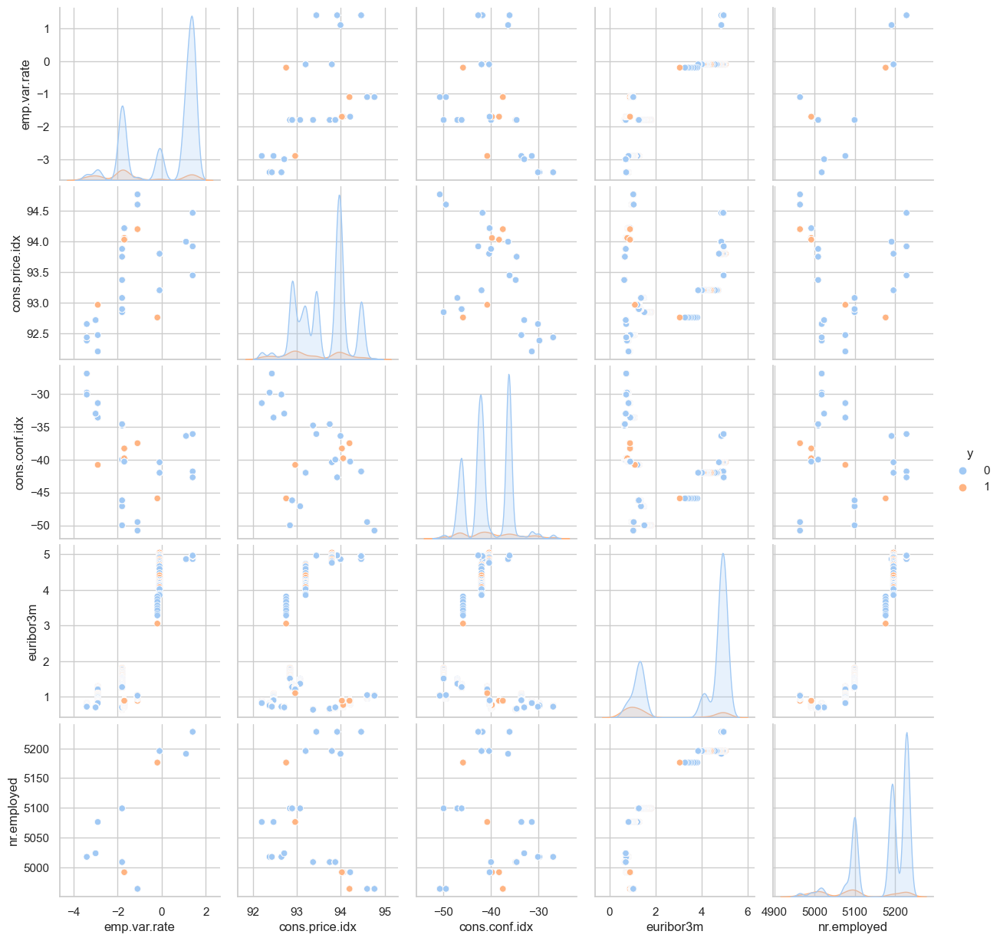

In [63]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select the features of interest
features_of_interest = ['emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'y']

sns.pairplot(df_clean[features_of_interest], hue='y', palette='pastel')
plt.show()


* We observe similar trends in the plots of euribor vs. (cons.price and cons.conf). We notice that as euribor increases, the employment rate also tends to increase. Additionally, we observe that higher index values are associated with a higher likelihood of making a deposit.
* When the 'emp.var.rate' is negative, customers are more inclined to respond affirmatively. Although this variable is beyond the bank's control, it may signify something significant as it demonstrates a discernible trend. Hence, it warrants inclusion in the model.

In [64]:
correlation_matrix = df_clean.corr()
significant_correlations = correlation_matrix[(correlation_matrix > 0.3) & (correlation_matrix < 1.0)]
significant_correlations = significant_correlations.dropna(axis=0, how='all').dropna(axis=1, how='all')
significant_correlations_table = pd.DataFrame(significant_correlations.stack())
significant_correlations_table.reset_index(inplace=True)
significant_correlations_table.columns = ['Feature 1', 'Feature 2', 'Correlation']

print(significant_correlations_table)


         Feature 1       Feature 2  Correlation
0         duration               y     0.405285
1         previous            year     0.499292
2     emp.var.rate  cons.price.idx     0.775290
3     emp.var.rate       euribor3m     0.972241
4     emp.var.rate     nr.employed     0.906945
5   cons.price.idx    emp.var.rate     0.775290
6   cons.price.idx       euribor3m     0.688167
7   cons.price.idx     nr.employed     0.521931
8        euribor3m    emp.var.rate     0.972241
9        euribor3m  cons.price.idx     0.688167
10       euribor3m     nr.employed     0.945146
11     nr.employed    emp.var.rate     0.906945
12     nr.employed  cons.price.idx     0.521931
13     nr.employed       euribor3m     0.945146
14               y        duration     0.405285
15               y            year     0.327405
16            year        previous     0.499292
17            year               y     0.327405


* The social and economic factors show significant differences concerning whether clients say yes or no. This suggests they're likely important for predicting responses. They have various patterns and don't spread out evenly.

* Also, except for consumer confidence, these factors are closely connected. This means we might only need one of them in our model, as they tell us similar things about the economy.

# Feature Engineering

## Handling Outliers

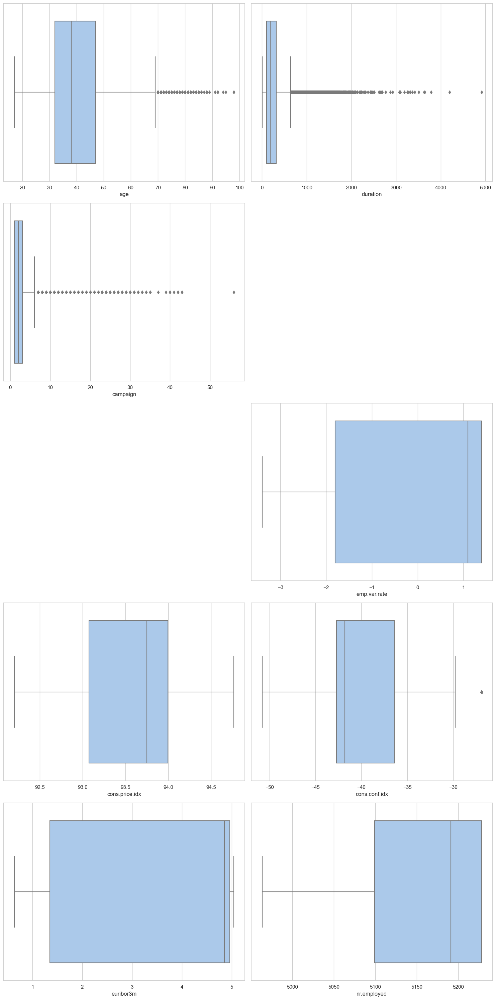

In [65]:
plt.figure(figsize=(15, 30))
sns.set_palette("pastel")

plt.subplot(5, 2, 1)
sns.boxplot(x=df_clean['age'])

plt.subplot(5, 2, 2)
sns.boxplot(x=df_clean['duration'])

plt.subplot(5, 2, 3)
sns.boxplot(x=df_clean['campaign'])

plt.subplot(5, 2, 6)
sns.boxplot(x=df_clean['emp.var.rate'])

plt.subplot(5, 2, 7)
sns.boxplot(x=df_clean['cons.price.idx'])

plt.subplot(5, 2, 8)
sns.boxplot(x=df_clean['cons.conf.idx'])

plt.subplot(5, 2, 9)
sns.boxplot(x=df_clean['euribor3m'])

plt.subplot(5, 2, 10)
sns.boxplot(x=df_clean['nr.employed'])

plt.tight_layout()
plt.show()


### Statistical outlier detection for extreme outliers: 
Statistical outlier detection entails using statistical methods to pinpoint exceptional data points within a dataset.
By converting these outliers into $ \underline{z-scores} $, you can gauge how many standard deviations they deviate from the mean.
When a data point's z-score is notably high or low, it's typically flagged as an outlier. A commonly used benchmark is a z-score exceeding 3 or falling below -3.

To apply statistical outlier detection using z-scores to your data, you can follow these steps:

* Calculate Z-Scores: Compute the z-scores for each data point in your dataset. The z-score of a data point measures how many standard deviations it is away from the mean.

$ Z = \frac{(X - \mu)}{\sigma} $


Where:

X is the value of the data point. $ \newline $ 
μ is the mean of the data. $ \newline $ 
σ is the standard deviation of the data.

* Identify Outliers: Any data point with a z-score greater than 3 or less than -3 is typically considered an outlier.

In [66]:
# Convert non-numeric columns to numeric if possible
df_clean_numeric = df_clean.apply(pd.to_numeric, errors='coerce')
df_clean_numeric = df_clean_numeric.dropna() # drop columns with missing values
z_scores = stats.zscore(df_clean_numeric)
threshold = 3 #detect extreme outliers
# Find outliers based on z-scores
outliers = df_clean_numeric[(z_scores > threshold).any(axis=1)]
print("Outliers:")
print(outliers)


Outliers:
Empty DataFrame
Columns: [age, job, marital, education, housing, loan, contact, month, day_of_week, duration, campaign, previous, poutcome, emp.var.rate, cons.price.idx, cons.conf.idx, euribor3m, nr.employed, y, year]
Index: []


the DataFrame outliers is empty, it means that there are no outliers detected based on the specified threshold (z-score > 3). This suggests that the data points in your DataFrame are within a reasonable range and do not exhibit extreme deviations from the mean. Therefore, there are no observations in the dataset that can be considered outliers according to the defined criteria.

However, we are aware that there were outliers in age, duration, and campaign. Let's utilize the IQR method for further investigation.

### IQR Method:


The interquartile range (IQR) tells the range of the middle half of your dataset. It can be used to create “fences” around data and then define outliers as any values that fall outside those fences.
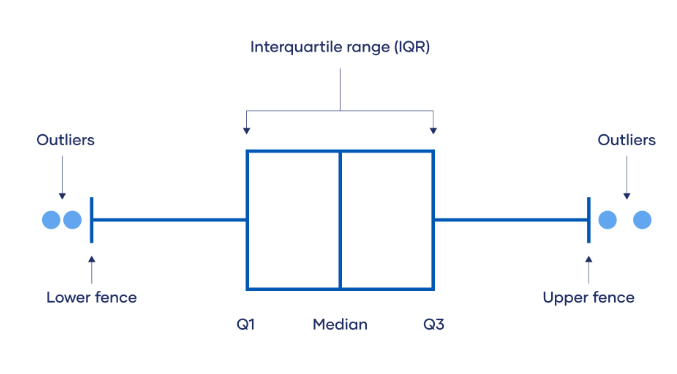
To detect outliers using the Interquartile Range (IQR) method:

1. Calculate the first quartile (Q1) and third quartile (Q3) of the data.
2. Compute the interquartile range (IQR) as the difference between Q3 and Q1: 

\[ IQR = Q3 - Q1 \]

3. Define a threshold to identify outliers. Typically, values that fall below \( Q1 - 1.5 \times IQR \) or above \( Q3 + 1.5 \times IQR \) are considered outliers.
4. Identify any data points that fall outside of the defined threshold as outliers.



In [67]:

Q1_age = df_clean['age'].quantile(0.25)
Q3_age = df_clean['age'].quantile(0.75)
Q1_duration = df_clean['duration'].quantile(0.25)
Q3_duration = df_clean['duration'].quantile(0.75)
Q1_campaign = df_clean['campaign'].quantile(0.25)
Q3_campaign = df_clean['campaign'].quantile(0.75)

IQR_age = Q3_age - Q1_age
IQR_duration = Q3_duration - Q1_duration
IQR_campaign = Q3_campaign - Q1_campaign

# Define the thresholds to identify outliers
threshold_age_low = Q1_age - 1.5 * IQR_age
threshold_age_high = Q3_age + 1.5 * IQR_age
threshold_duration_low = Q1_duration - 1.5 * IQR_duration
threshold_duration_high = Q3_duration + 1.5 * IQR_duration
threshold_campaign_low = Q1_campaign - 1.5 * IQR_campaign
threshold_campaign_high = Q3_campaign + 1.5 * IQR_campaign

# Identify outliers for 'age', 'duration', and 'campaign'
outliers_age = df_clean[(df_clean['age'] < threshold_age_low) | (df_clean['age'] > threshold_age_high)]
outliers_duration = df_clean[(df_clean['duration'] < threshold_duration_low) | (df_clean['duration'] > threshold_duration_high)]
outliers_campaign = df_clean[(df_clean['campaign'] < threshold_campaign_low) | (df_clean['campaign'] > threshold_campaign_high)]

print("Outliers for Age:")
print(outliers_age)
print("\nOutliers for Duration:")
print(outliers_duration)
print("\nOutliers for Campaign:")
print(outliers_campaign)



Outliers for Age:
       age      job   marital           education housing loan   contact  \
27713   70  retired  divorced               basic     yes   no  cellular   
27757   76  retired   married    universitydegree      no  yes  cellular   
27780   73  retired   married    universitydegree     yes   no  cellular   
27800   88  retired  divorced               basic     yes   no  cellular   
27802   88  retired  divorced               basic      no   no  cellular   
...    ...      ...       ...                 ...     ...  ...       ...   
40986   84  retired  divorced               basic     yes  yes  cellular   
40996   81  retired   married               basic     yes   no  cellular   
41004   80  retired   married  professionalcourse     yes   no  cellular   
41183   73  retired   married  professionalcourse     yes   no  cellular   
41187   74  retired   married  professionalcourse     yes   no  cellular   

      month day_of_week  duration  campaign  previous     poutcome  \

In [68]:
numerical_features = ['age', 'campaign', 'duration']
for col in numerical_features:
    Q1 = df_clean[col].quantile(0.25)
    Q3 = df_clean[col].quantile(0.75)
    IQR = Q3 - Q1

    # Filtering outliers using IQR method
    filter_condition = (df_clean[col] >= Q1 - 1.5 * IQR) & (df_clean[col] <= Q3 + 1.5 * IQR)
    df_clean = df_clean.loc[filter_condition]


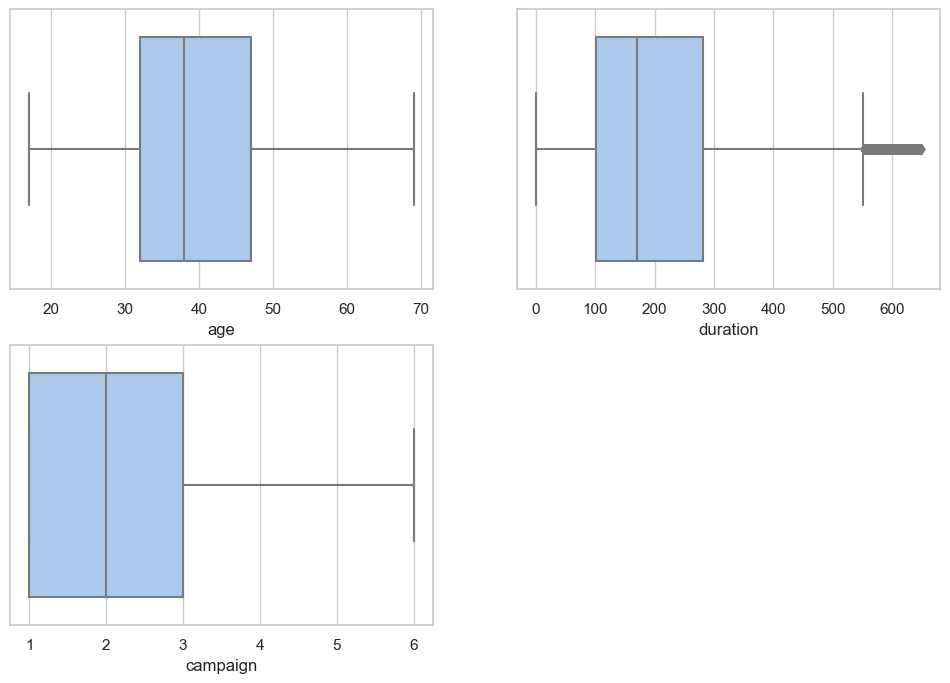

In [69]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.set_palette("pastel")

ax = plt.subplot(221)
sns.boxplot(x=df_clean['age'])


ax = plt.subplot(222)
sns.boxplot(x=df_clean['duration'])


ax = plt.subplot(223)
sns.boxplot(x=df_clean['campaign'])


plt.show()


## Encoding

Converting categorical variables into a numerical format is an essential preprocessing step in readying data for machine learning tasks. Categorical data, which consists of non-numeric values like text or categories, needs to be encoded into numerical representations to ensure compatibility with machine learning algorithms. 

In [70]:
df_clean1= df_clean.copy()


In [71]:
print(df_clean1.columns)


Index(['age', 'job', 'marital', 'education', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'duration', 'campaign', 'previous', 'poutcome',
       'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m',
       'nr.employed', 'y', 'year'],
      dtype='object')


##### mapping / ordinal encoding

This encoding technique is used to convert categorical variables with a natural ordering or hierarchy into a numerical format. For example, months and days of the week have an inherent order, and assigning numerical values to them can capture this order, allowing machine learning algorithms to interpret it.

In this case, we used ordinal encoding because:

* Months and days of the week have a clear order, which can be captured by assigning numerical values.
* It simplifies the feature space by converting categorical variables into numerical ones, making it easier for machine learning algorithms to process.
* It preserves the ordinal relationship between categories, which can be important for certain algorithms to learn patterns effectively.

In [72]:
month_dict = {'jan':1, 'feb':2, 'mar':3, 'apr':4, 'may': 5, 'jul': 7, 'aug': 8, 'jun': 6, 'nov': 11, 'apr': 4, 'oct': 10, 'sep': 9, 'mar': 3, 'dec': 12}
df_clean1['month'] = df_clean1['month'].map(month_dict)

day_dict = {'thu': 5, 'mon': 2, 'wed': 4, 'tue': 3, 'fri': 6}
df_clean1['day_of_week'] = df_clean1['day_of_week'].map(day_dict)

In [73]:
df_clean1.loc[:, ['month', 'day_of_week']].tail()


,month,day_of_week
41181,11,6
41182,11,6
41184,11,6
41185,11,6
41186,11,6


<u>mapping for housing and loan:</u>

* Conversion to binary representation: The original categorical variables ('housing' and 'loan') have three categories each ('yes', 'no', and 'unknown'). By mapping 'yes' to 1 and 'no' to 0, we convert them into binary variables, which are commonly used in machine learning algorithms. This binary representation simplifies the interpretation of the variables, making them easier to use in predictive models.
* Handling of 'unknown' category: The 'unknown' category represents missing or unknown values. By mapping it to -1, we create a distinct numerical value to represent this category. This allows us to retain information about the presence of missing data while still converting the variable into numerical format.
* Simplicity and clarity: Mapping provides a simple and clear way to convert categorical variables into numerical ones. It's straightforward to understand and implement, making it a practical choice for this encoding task.

In [74]:
dictionary = {'yes': 1, 'no': 0, 'unknown': -1}
df_clean1['housing'] = df_clean1['housing'].map(dictionary)
df_clean1['loan'] = df_clean1['loan'].map(dictionary)

df_clean1.loc[:, ['housing', 'loan']].head()


,housing,loan
0,0,0
1,0,0
2,1,0
3,0,0
4,0,1


#### Dummy variables


This encoding technique is known as one-hot encoding or dummy variable encoding. It involves creating binary dummy variables for each category of a categorical variable, where each variable represents the presence (1) or absence (0) of a category.

In [75]:
# Convert categorical variables into dummy/indicator variables
dummy_contact = pd.get_dummies(df_clean1['contact'], prefix='contact_dummy', drop_first=True)
dummy_outcome = pd.get_dummies(df_clean1['poutcome'], prefix='poutcome_dummy', drop_first=True)

# Concatenate the dummy variables with the original dataframe
df_clean1 = pd.concat([df_clean1, dummy_contact, dummy_outcome], axis=1)

# Drop the original categorical columns
df_clean1.drop(['contact', 'poutcome'], axis=1, inplace=True)

We chose one-hot encoding for the 'contact' and 'poutcome' variables for these main reasons:
* One-hot encoding eliminates the need for arbitrary numerical assignments to categories. Each category is represented by its own binary variable, avoiding the imposition of any artificial ordinality on the data.
* One-hot encoding preserves all the information present in the original categorical variables. Each category of the original variables becomes a separate binary variable, ensuring that no information is lost during the encoding process.




In [76]:
# Select only the dummy variable columns
dummy_columns = df_clean1.filter(like='contact_dummy').columns.tolist() + df_clean1.filter(like='poutcome_dummy').columns.tolist()

# Display the first few rows of the dummy variable columns
print(df_clean1[dummy_columns].head())


   contact_dummy_telephone  poutcome_dummy_nonexistent  poutcome_dummy_success
0                        1                           1                       0
1                        1                           1                       0
2                        1                           1                       0
3                        1                           1                       0
4                        1                           1                       0


#### Frequency Encoding

The technique used here is frequency encoding, where categorical variables are encoded based on the frequency of each category in the dataset.

Here's how it works:

1. First, the frequency of each category in the original categorical variables ('job' and 'education') is calculated using the value_counts() function. 
2. The frequencies are then converted into dictionaries (bank_job and bank_ed) for each variable, where the category names are the keys and their respective frequencies are the values.
3. Each category in the original categorical variables is replaced with its corresponding frequency using the map() function. 
 After applying this encoding technique, the categorical variables ('job' and 'education') are transformed into numerical representations based on the frequency of each category. 

In [77]:
bank_job = df_clean1['job'].value_counts().to_dict()
bank_ed = df_clean1['education'].value_counts().to_dict() 
df_clean1['job'] = df_clean1['job'].map(bank_job)
df_clean1['education'] = df_clean1['education'].map(bank_ed)


In [78]:
df_clean1.loc[:, ['job', 'education']].head()


,job,education
0,899,12144
1,3454,8282
2,3454,8282
3,9385,12144
4,3454,8282


frequency encoding is chosen for these reasons: 
* Frequency encoding is particularly useful for categorical variables with high cardinality (many unique categories). Instead of creating a large number of dummy variables as in one-hot encoding, frequency encoding reduces dimensionality by representing categories with their frequencies.
* Frequency encoding can help to avoid overfitting, especially in cases where one-hot encoding might lead to a sparse dataset with many features.

#### Target Guided Ordinal Encoding

In target-guided ordinal encoding, the ordinal labels are assigned based on the relationship between the categorical variable and the target variable. This relationship is usually determined by calculating some statistic (such as the mean, median, or sum) of the target variable for each category of the categorical variable.

In [79]:
# Calculate the mean of the target variable ('y') for each category of the 'marital' variable
df_clean1.groupby(['marital'])['y'].mean()
# Sort the categories of 'marital' based on their mean target values
ordinal_labels = df_clean1.groupby(['marital'])['y'].mean().sort_values().index
# Assign ordinal labels to the categories based on their order
ordinal_labels2 = {k: i for i, k in enumerate(ordinal_labels, 0)}
ordinal_labels2
df_clean1['marital_ordinal'] = df_clean1['marital'].map(ordinal_labels2)
df_clean1.drop(['marital'], axis=1, inplace=True)
df_clean1.marital_ordinal.value_counts()


1    21559
2    10083
0     3905
Name: marital_ordinal, dtype: int64

In [80]:
# Display some samples 
print(df_clean1[['marital_ordinal']].sample(20))


       marital_ordinal
32563                1
23155                1
3078                 0
32661                1
11137                1
10908                0
2069                 1
32888                1
29813                2
11412                1
16865                1
17951                1
5912                 1
2461                 0
419                  2
8860                 1
30481                2
29589                2
28117                1
51                   1


* Target-guided ordinal encoding focuses on the relationship between the categorical variable and the target variable, aiming to capture the ordinal relationship between categories based on their association with the target variable.
* Ordinal labels are assigned to categories based on their order of this statistic, with higher values corresponding to categories that are associated with higher values of the target variable. 

this technique is useful because it can potentially improve the predictive performance of the model.The resulting ordinal labels provide insight into the relationship between marital status and the target variable.

#### Scaling 

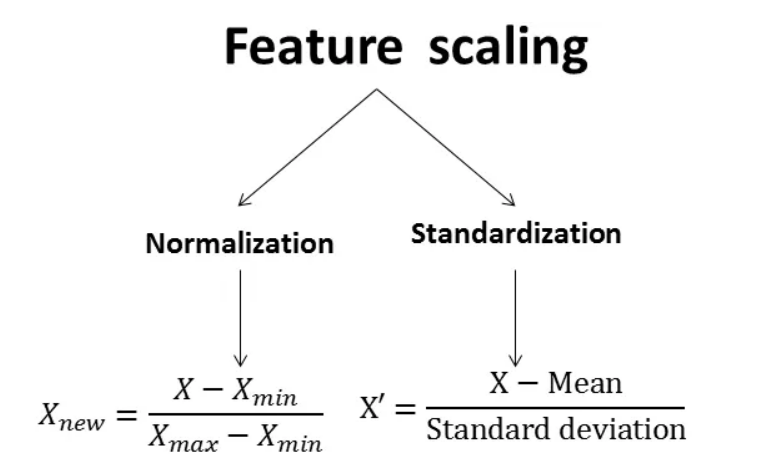

In [81]:
# data type of each feature in the DataFrame
print(df_clean1.dtypes)


age                              int64
job                              int64
education                        int64
housing                          int64
loan                             int64
month                         category
day_of_week                      int64
duration                         int64
campaign                         int64
previous                         int64
emp.var.rate                   float64
cons.price.idx                 float64
cons.conf.idx                  float64
euribor3m                      float64
nr.employed                    float64
y                                int64
year                             int32
contact_dummy_telephone          uint8
poutcome_dummy_nonexistent       uint8
poutcome_dummy_success           uint8
marital_ordinal                  int64
dtype: object


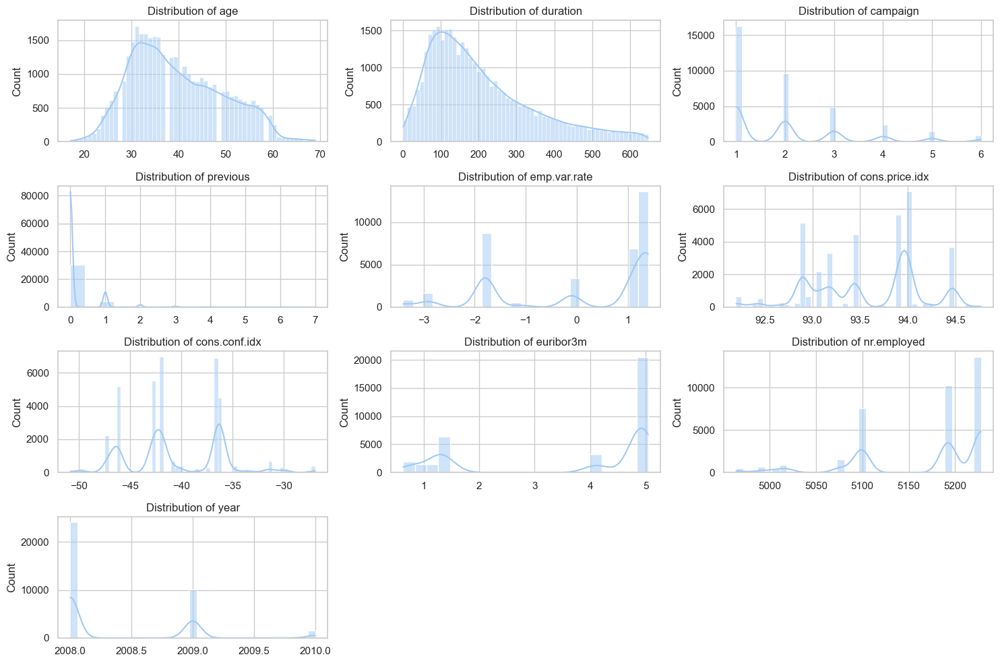

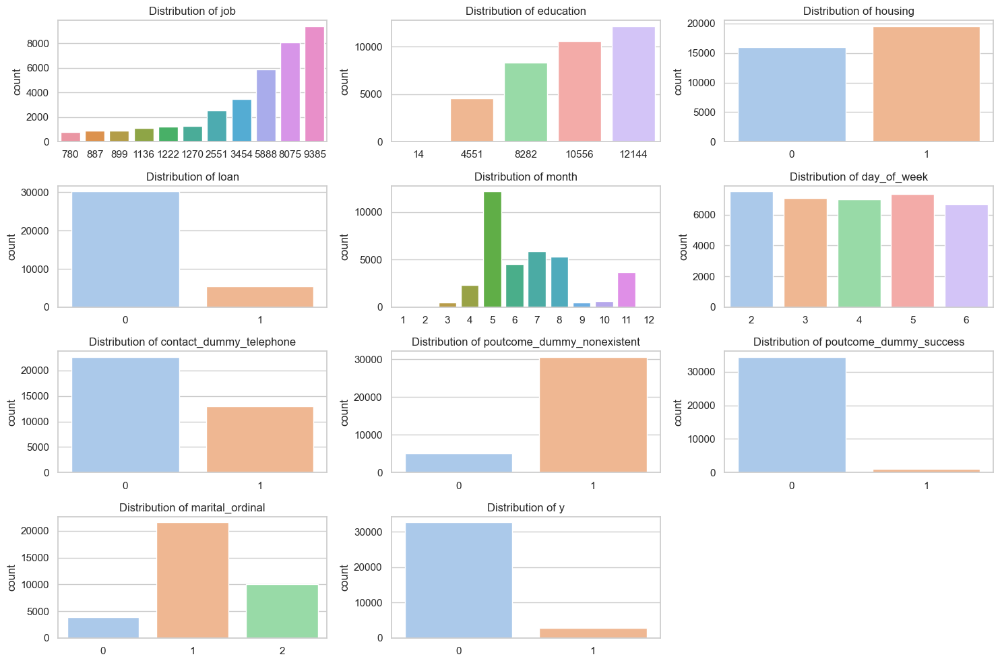

In [82]:
# numerical and categorical features
numerical_features = ['age', 'duration', 'campaign', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'year']
categorical_features = ['job', 'education', 'housing', 'loan', 'month', 'day_of_week', 'contact_dummy_telephone', 'poutcome_dummy_nonexistent', 'poutcome_dummy_success', 'marital_ordinal', 'y']

# Plot histograms for numerical features
plt.figure(figsize=(15, 10))
for i, feature in enumerate(numerical_features, 1):
    plt.subplot(4, 3, i)
    sns.histplot(df_clean1[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    plt.xlabel('')
plt.tight_layout()
plt.show()

# Plot count plots for categorical features
plt.figure(figsize=(15, 10))
for i, feature in enumerate(categorical_features, 1):
    plt.subplot(4, 3, i)
    sns.countplot(data=df_clean1, x=feature)
    plt.title(f'Distribution of {feature}')
    plt.xlabel('')
plt.tight_layout()
plt.show()


* Standardizing features is a preprocessing step in machine learning. First, it ensures scale consistency by transforming features to have a mean of 0 and a standard deviation of 1, facilitating the comparison of their relative importance within the model.Second, for distance-based algorithms like K-Nearest Neighbors and Support Vector Machines, standardizing features is essential to prevent those with larger scales from unduly influencing distance calculations.Lastly, standardization preserves the interpretability of the model by keeping the relationship between features and the target variable unchanged, while placing them on a consistent scale for easier coefficient interpretation.

* Normalization is a method of scaling a variable to a fixed range, typically between 0 and 1. Normalization is typically used when the scale of a variable is not known or when the variable has a non-uniform distribution. This method helps to bring all the variables on the same scale and it will be easier for the model to converge.

In [83]:
from sklearn.preprocessing import StandardScaler

# Select numerical features for standardization
numerical_features = ['age', 'duration', 'campaign', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'year']

# Calculate mean and standard deviation
mean_values = df_clean1[numerical_features].mean()
std_values = df_clean1[numerical_features].std()

# Check min-max values
min_values = df_clean1[numerical_features].min()
max_values = df_clean1[numerical_features].max()

print("Mean values :\n", mean_values)
print("\nStandard deviation values :\n", std_values)
print("\nMin values :\n", min_values)
print("\nMax values :\n", max_values)


Mean values :
 age                 39.598813
duration           207.151180
campaign             2.044279
previous             0.174980
emp.var.rate         0.064931
cons.price.idx      93.566402
cons.conf.idx      -40.523909
euribor3m            3.609170
nr.employed       5166.692784
year              2008.365178
dtype: float64

Standard deviation values :
 age                 9.678931
duration          140.527709
campaign            1.284407
previous            0.493291
emp.var.rate        1.567029
cons.price.idx      0.576952
cons.conf.idx       4.623697
euribor3m           1.731412
nr.employed        71.489404
year                0.560738
dtype: float64

Min values :
 age                 17.000
duration             1.000
campaign             1.000
previous             0.000
emp.var.rate        -3.400
cons.price.idx      92.201
cons.conf.idx      -50.800
euribor3m            0.634
nr.employed       4963.600
year              2008.000
dtype: float64

Max values :
 age                 

#### How to determine if our data is standardized?

* the mean of the variable should be zero and the standard deviation should be one. 
* The distribution of the standardized data should be a normal distribution.
* variablesshould have have a minimum value of -3 and a maximum of 3 if the data is standardized using the z-score method.


There are some built-in functions in some libraries like scikit-learn, which can be used to standardize the data. Functions like StandardScaler() or MinMaxScaler() can be used to standardize the data.

In our case, we are utilizing the `StandardScaler()` function to standardize features within our dataset. This process involves removing the mean and scaling the features to have unit variance.

The standard score, or z-score, of a sample \( x \) is calculated using the formula:
$ z = \frac{{x - \mu}}{{\sigma}} $

Where \( \mu \) represents the mean of the training samples (or zero if `with_mean=False`), and \( \sigma \) represents the standard deviation of the training samples (or one if `with_std=False`).

Standardization involves centering and scaling each feature independently by computing the relevant statistics on the samples in the training set. The mean and standard deviation are then stored to be used for later data transformations using the `transform()` function. This ensures consistency in the scaling process across different datasets or during model deployment.
Standardization (or z-score normalization) is often preferred when the features have varying scales and the data does not follow a strict uniform distribution, which is our case. Also, certain machine learning algorithms, such as K-Nearest Neighbors (KNN) and Support Vector Machines (SVM) with radial basis function (RBF) kernels, are sensitive to feature scale. Standardizing the features can help these algorithms perform better by making the feature space more isotropic.


In [84]:
from sklearn.preprocessing import StandardScaler

df_scale = df_clean1.copy()
# Define the list of categorical variables that will not be scaled
categorical_variables = ['job', 'education', 'housing', 'loan', 'month',
       'day_of_week', 'y',  'marital_ordinal']
# Create a list of numerical features to be scaled by excluding the categorical variables
features_to_scale = [feature for feature in df_scale.columns if feature not in categorical_variables]

scaler = StandardScaler()
scaler.fit(df_scale[features_to_scale])


StandardScaler()

In [85]:
# Concatenate the scaled numerical features with the categorical features
scaled_data = pd.concat([df_scale[categorical_variables].reset_index(drop=True),
                         pd.DataFrame(scaler.transform(df_scale[features_to_scale]), columns=features_to_scale)],
                        axis=1)
scaled_data.head()


,job,education,housing,loan,month,day_of_week,y,marital_ordinal,age,duration,...,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,year,contact_dummy_telephone,poutcome_dummy_nonexistent,poutcome_dummy_success
0,899,12144,0,0,5,2,0,1,1.694549,0.383195,...,-0.354724,0.660539,0.741144,0.89192,0.720711,0.340016,-0.651256,1.322328,0.402927,-0.183094
1,3454,8282,0,0,5,2,0,1,1.797867,-0.413812,...,-0.354724,0.660539,0.741144,0.89192,0.720711,0.340016,-0.651256,1.322328,0.402927,-0.183094
2,3454,8282,1,0,5,2,0,1,-0.268506,0.134131,...,-0.354724,0.660539,0.741144,0.89192,0.720711,0.340016,-0.651256,1.322328,0.402927,-0.183094
3,9385,12144,0,0,5,2,0,1,0.041450,-0.399579,...,-0.354724,0.660539,0.741144,0.89192,0.720711,0.340016,-0.651256,1.322328,0.402927,-0.183094
4,3454,8282,0,1,5,2,0,1,1.694549,0.710538,...,-0.354724,0.660539,0.741144,0.89192,0.720711,0.340016,-0.651256,1.322328,0.402927,-0.183094


### Feature Selection

Extra Trees Classifier is an ensemble learning method that combines multiple decision trees to make predictions. By aggregating the results of multiple weak learners, Extra Trees Classifier can provide more robust and stable feature importance estimates, reducing the risk of selecting features that are only important by chance.

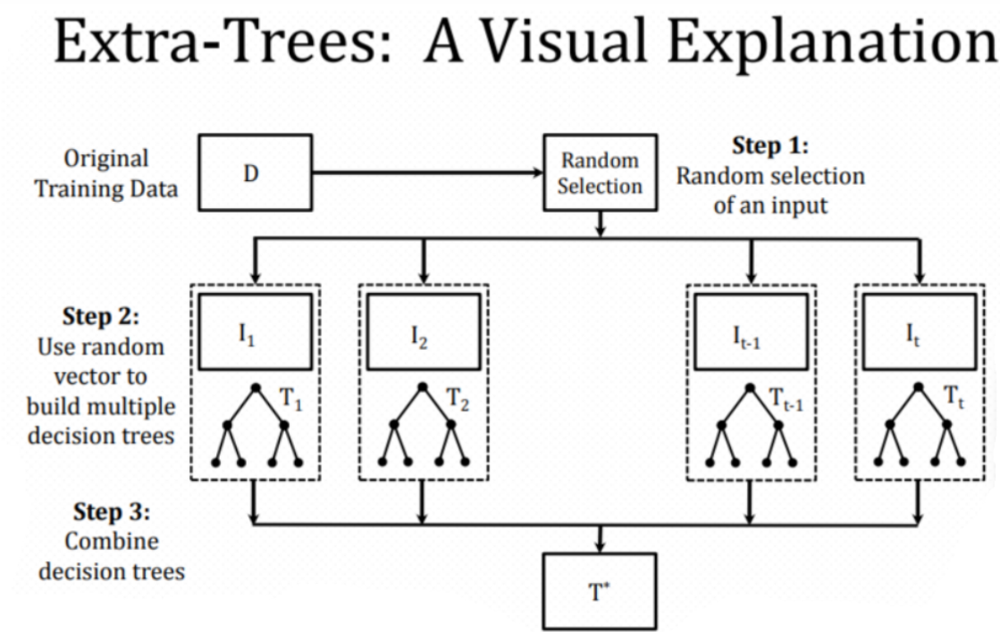

The Extra Trees Classifier for feature selection offers advantages:
* Robust to noise and irrelevant features: Extra Trees Classifier utilizes multiple decision trees and selects features based on their importance scores, making it less sensitive to noise and irrelevant features. 
* Computational efficiency
* Bias reduction: The random selection of subsets and random splitting points in Extra Trees Classifier helps to reduce the bias that can arise from using a single decision tree.
* Feature ranking: Extra Trees Classifier assigns importance scores to each feature.
* Handling multicollinearity: The Extra Trees Classifier can handle correlated features effectively. By randomly selecting subsets of features and utilizing random splits, it reduces the impact of multicollinearity, unlike methods that rely on explicit feature correlations.
* Feature selection flexibility: The feature selection process in Extra Trees Classifier is based on feature importances, allowing us to adapt the threshold for feature inclusion according to your specific needs. 
* Generalization and interpretability: By selecting a subset of relevant features, Extra Trees Classifier can improve model generalization by reducing overfitting. Additionally, the selected features can provide interpretable insights into the factors that drive predictions and influence the target variable.


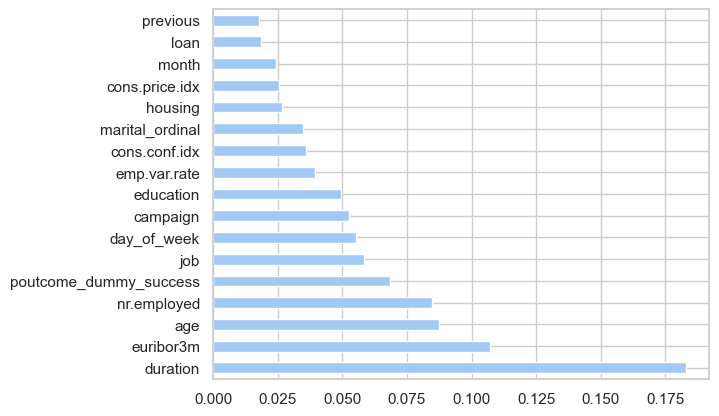

In [86]:
from sklearn.ensemble import ExtraTreesClassifier

# Drop the 'year' feature from the DataFrame because it was not in our data at first
X = scaled_data.drop(['y', 'year'], axis=1) 
y = scaled_data['y']

# Initialize and fit the Extra Trees Classifier model
model = ExtraTreesClassifier()
model.fit(X, y)

# Calculate feature importances and create a Series
feat_importances = pd.Series(model.feature_importances_, index=X.columns)

# Plot the top 17 most important features
feat_importances.nlargest(17).plot(kind='barh')
plt.show()


The bar plot illustrates the importance of each feature in influencing the output. Let's focus on the top 15 features.

## Train and Test Split

In [87]:
from sklearn.model_selection import train_test_split
# Drop specified features taht we are not going to use from the dataset
X=scaled_data.drop(['previous','loan','year','contact_dummy_telephone','poutcome_dummy_nonexistent','y'],axis=1)
y=scaled_data.y
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y,train_size=0.8,random_state=1)
print("Input Training:",X_train.shape)
print("Input Test:",X_test.shape)
print("Output Training:",y_train.shape)
print("Output Test:",y_test.shape)

Input Training: (28437, 15)
Input Test: (7110, 15)
Output Training: (28437,)
Output Test: (7110,)


## Modeling Data

Our primary objective is to forecast whether a deposit is made based on the values of the features. The output variable is binary, taking on values of either 0 or 1. Given this nature of the problem, it is evident that we can employ classification models to address our objective.

### Model Selection 

To  determine the most suitable classification models, we employ cross-validation rather than running multiple models individually. Cross-validation involves systematically partitioning the dataset into subsets, training the model on a portion of the data, and evaluating its performance on the remaining data.
By repeating this process with different partitions, we obtain multiple estimates of the model's accuracy. This allows us to compare the performance of various models comprehensively and select the one with the highest accuracy for our task. Through cross-validation, we ensure the robustness and reliability of our model selection process, optimizing our decision-making and resource utilization.

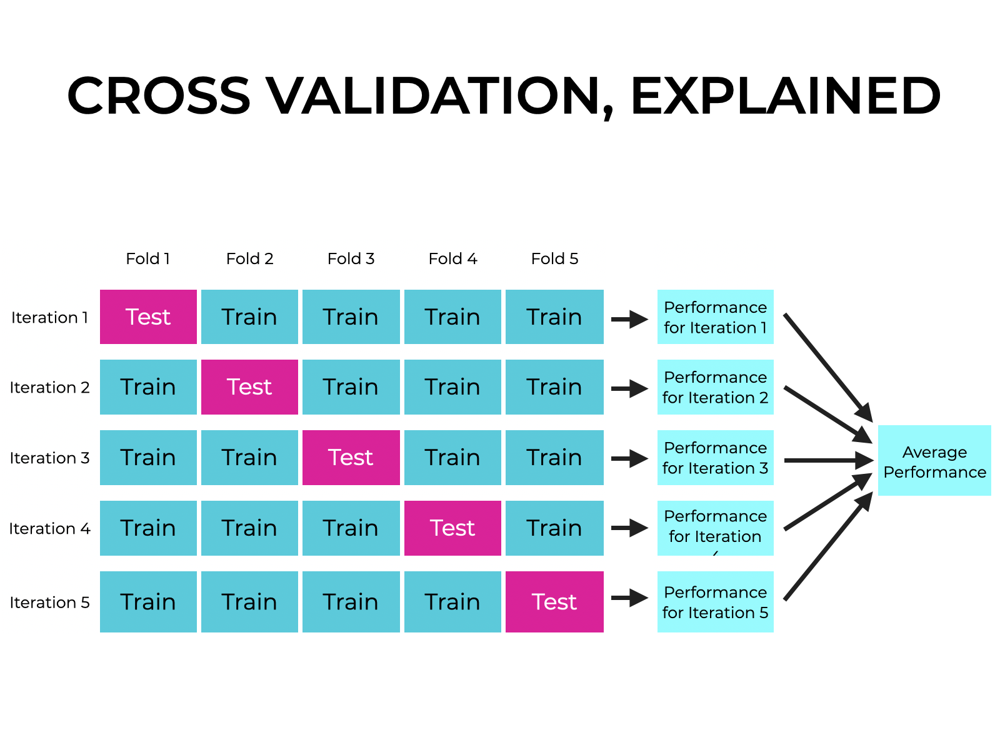

#### The models : 

Our data is imbalanced. This can be  managed through resampling techniques or by utilizing models specifically designed to handle such scenarios. Here are some machine learning models adept at handling imbalanced data in classification tasks:

* Random Forest: An ensemble learning method that combines multiple decision trees, Random Forest excels at capturing intricate relationships within imbalanced datasets.
* Gradient Boosting Machines (GBM): GBM sequentially builds trees, focusing on correcting previous mistakes, making it well-suited for improving performance on both classes in imbalanced data.
* Support Vector Machines (SVM): SVM, a robust classification algorithm, can be tailored to handle imbalanced data by adjusting class weights or employing cost-sensitive learning methods.
* AdaBoost: This ensemble learning method assigns higher weights to misclassified minority class instances, effectively addressing imbalanced data challenges.
* XGBoost: Renowned for its speed and performance, XGBoost adapts to class imbalance by adjusting learning objectives or incorporating class weights.
* Logistic Regression with Class Weights: Logistic Regression, a straightforward yet powerful algorithm, effectively manages imbalanced data by adjusting class weights or employing penalized techniques.
* Nearest Neighbors with Weighted Voting: k-Nearest Neighbors (kNN) can be adapted for imbalanced data by utilizing weighted voting, where closer neighbors contribute more significantly to classification decisions.

In [88]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import BernoulliNB
logreg_cv = LogisticRegression(random_state=0)
dt_cv=DecisionTreeClassifier()
knn_cv=KNeighborsClassifier()
svc_cv=SVC()
nb_cv=BernoulliNB()
cv_dict = {0: 'Logistic Regression', 1: 'Decision Tree',2:'KNN',3:'SVC',4:'Naive Bayes'}
cv_models=[logreg_cv,dt_cv,knn_cv,svc_cv,nb_cv]

for i,model in enumerate(cv_models):
    print("{} Test Accuracy: {}".format(cv_dict[i],cross_val_score(model, X, y, cv=10, scoring ='accuracy').mean()))

C:\Users\21696\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\21696\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\21696\anaconda3\lib\site-packages

Logistic Regression Test Accuracy: 0.8817240216645417
Decision Tree Test Accuracy: 0.6422242009360108


C:\Users\21696\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.

C:\Users\21696\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.

C:

KNN Test Accuracy: 0.8335343152502638
SVC Test Accuracy: 0.9188679857564267
Naive Bayes Test Accuracy: 0.7311822814886576


* Logistic Regression Test Accuracy: 0.8817240216645417
* Decision Tree Test Accuracy: 0.6422242009360108
* KNN Test Accuracy: 0.8335343152502638
* SVC Test Accuracy: 0.9188679857564267
* Naive Bayes Test Accuracy: 0.7311822814886576

Based on the test results, we observe that the Support Vector Classifier (SVC) demonstrates the highest accuracy, followed by Logistic Regression.Let's explore them deeper.

## Logistic Regression

### Hyperparameter tuning

We'll train the logistic regression model with optimized parameters and evaluate its accuracy to gauge its performance.
we perform hyperparameter tuning for a logistic regression model using grid search with cross-validation.

#### Hyperparameters: 

Hyperparameters are external settings chosen by the user before training the model. They influence the model's behavior and performance but are not learned from the data. Techniques like grid search can help optimize hyperparameters by evaluating different combinations to enhance model performance.

#### Grid seach:

To find the best hyperparameters for optimal model performance, methods like Grid Search offer systematic exploration of different combinations. Unlike manual search, Grid Search evaluates various hyperparameter values exhaustively. By performing cross-validation, it assesses model performance across different parameter settings. However, this exhaustive approach can be time-consuming and resource-intensive as the number of hyperparameters increases.

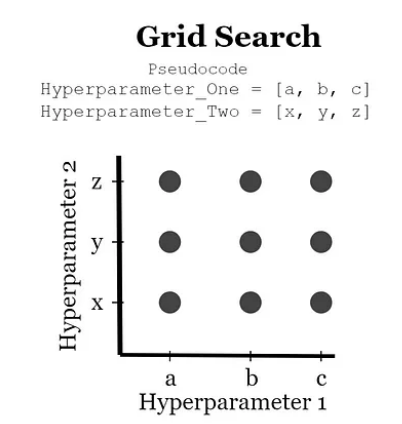

In [90]:

from sklearn.model_selection import GridSearchCV

# Define the parameter grid for hyperparameter tuning
param_grid = {'C': np.logspace(-4, 4, 50),  # Range of values for regularization parameter C
             'penalty': ['l1', 'l2']}       # Regularization penalty types

# Initialize GridSearchCV object with logistic regression estimator
clf = GridSearchCV(LogisticRegression(random_state=0),   # Logistic regression estimator
                   param_grid,                        # Parameter grid for hyperparameter tuning
                   cv=5,                              # 5-fold cross-validation
                   verbose=0,                         # Verbosity level (0 for no output)
                   n_jobs=-1)                         # Use all available CPU cores

# Fit the grid search object to training data
best_model = clf.fit(X_train, y_train)

# Print the best estimator found by grid search
print(best_model.best_estimator_)

# Evaluate the mean accuracy of the best model on the test data
print("The mean accuracy of the model is:", best_model.score(X_test, y_test))


C:\Users\21696\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning:


250 fits failed out of a total of 500.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
250 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\21696\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\21696\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\21696\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 447, in _check_solver
    raise ValueError(


LogisticRegression(C=0.040949150623804234, random_state=0)
The mean accuracy of the model is: 0.930239099859353


We've obtained the optimal parameters for the model, achieving a mean accuracy of 93%.

In [91]:
logreg = LogisticRegression(C=0.040949150623804234, random_state=0)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.93


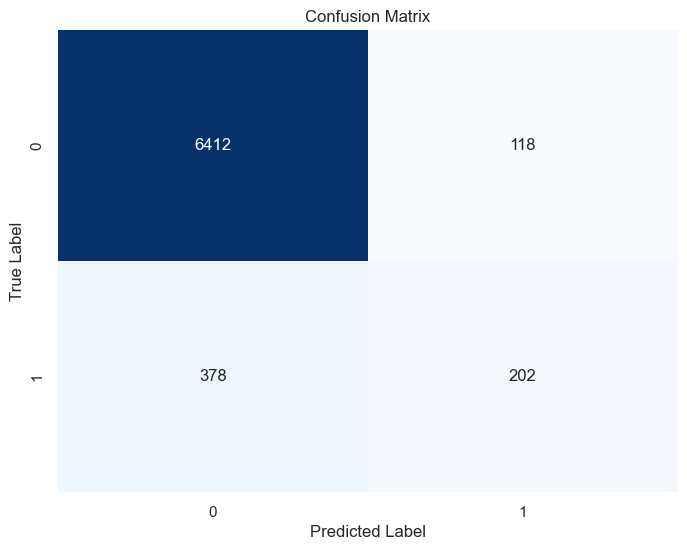

Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.98      0.96      6530
           1       0.63      0.35      0.45       580

    accuracy                           0.93      7110
   macro avg       0.79      0.67      0.71      7110
weighted avg       0.92      0.93      0.92      7110



In [93]:
from sklearn.metrics import confusion_matrix, classification_report

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Print classification report
print("Classification Report:\n", classification_report(y_test, y_pred))


This classification report provides an evaluation of the model's performance.
* Precision: For the negative class (0), the precision is high at 94%, indicating that out of all instances predicted as negative, 94% are correctly classified. However, for the positive class (1), the precision is lower at 63%, suggesting that only 63% of instances predicted as positive are actually positive.We have 94% precision which means the accuracy that the model classifier not to label an instance positive that is actually negative which is important as we shouldn't label a lead as positive in making a term deposit when he/she isn't interested in making a deposit
* Recall: The recall for the negative class is high (98%), indicating that 98% of actual negative instances are correctly classified by the model. Conversely, the recall for the positive class is lower (35%), implying that the model only identifies 35% of actual positive instances.
* F1-score: The F1-score is the harmonic mean of precision and recall, providing a balance between the two metrics. The F1-score for the negative class is high (96%), reflecting a good balance between precision and recall. However, for the positive class, the F1-score is lower (45%), indicating a trade-off between precision and recall.
* Support: This represents the number of instances in each class. In this case, there are 6530 instances of the negative class and 580 instances of the positive class.
* Accuracy: The overall accuracy of the model is 93%, indicating that 93% of all instances are correctly classified.
* Macro avg: This is the average of precision, recall, and F1-score across both classes. In this case, it is 79% for precision, 67% for recall, and 71% for F1-score.
* Weighted avg: This is the weighted average of precision, recall, and F1-score, taking into account the number of instances for each class. In this case, it is 92% for precision, 93% for recall, and 92% for F1-score.
Overall, the model performs well in predicting the negative class (0), but it struggles with the positive class (1), particularly in terms of recall and F1-score.








##### ROC Curve:

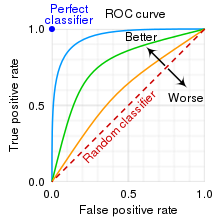

A Receiver Operating Characteristic (ROC) curve visually represents a binary classifier's diagnostic ability. It plots the true positive rate (TPR) against the false positive rate (FPR). TPR indicates the proportion of correct positive predictions, while FPR represents the proportion of incorrect positive predictions. In medical testing, TPR reflects the correct identification of individuals with a disease. For probabilistic classifiers, the ROC curve is generated by adjusting the score threshold, allowing us to assess the model's performance across various thresholds.

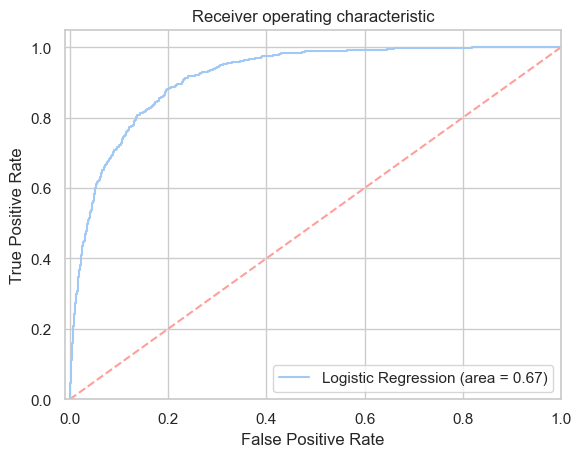

In [95]:
from sklearn.metrics import roc_auc_score, roc_curve

# Calculate ROC AUC score
logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))

# Compute ROC curve and its parameters
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()


The ROC curve indicates how well our logistic model distinguishes between true positives and false positives. A curve closer to the top-left corner suggests better model performance. For our analysis, a threshold value between 0.8 to 0.9 can optimize true positive outcomes.

## Support Vector Classifier

In [97]:
from sklearn import metrics
from sklearn.metrics import classification_report

svc_classifier = SVC(random_state = 0)
svc_classifier.fit(X_train,y_train)
y_pred=svc_classifier.predict(X_test)

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Classification Report:\n",classification_report(y_test,y_pred))

Accuracy: 0.9184247538677919
Classification Report:
               precision    recall  f1-score   support

           0       0.92      1.00      0.96      6530
           1       0.00      0.00      0.00       580

    accuracy                           0.92      7110
   macro avg       0.46      0.50      0.48      7110
weighted avg       0.84      0.92      0.88      7110



C:\Users\21696\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\21696\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\21696\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



The accuracy of the Support Vector Classifier (SVC) model is approximately 91.84%. However, the model performs poorly in predicting the minority class (class 1), as indicated by the low precision, recall, and F1-score for class 1. This suggests that the model struggles to correctly identify instances of the minority class, resulting in a low F1-score overall.